# Electricty Load Modeling 

### Goals: 
- Predictive modeling of electricy consumption in the dataset 
- identify trend models and backtest from there 


## Tasks:

#### Load Forecasting
- Short term and long term load forecasting 
- try to predict electrcity demand as a function of current demans 
#### Anomaly Detection
- spikes
#### Trends
- Are there any trends we can identify in the datasets 
#### Load Classification 
- Classify different types of loads
- Clustering exercises 
#### Feature Eng
- create new features 
- lags / averages / etc
#### Dataset Enhancement
- incorporate weather data into the model


In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import os 
pd.set_option('display.max_columns', None)

### Constants

### Dataset details 
This data package contains different kinds of timeseries data relevant for power system modelling, namely electricity prices, electricity consumption (load) as well as wind and solar power generation and capacities. The data is aggregated either by country, control area or bidding zone. Geographical coverage includes the EU and some neighbouring countries. All variables are provided in hourly resolution. Where original data is available in higher resolution (half-hourly or quarter-hourly), it is provided in separate files. This package version only contains data provided by TSOs and power exchanges via ENTSO-E Transparency, covering the period 2015-mid 2020. See previous versions for historical data from a broader range of sources. All data processing is conducted in Python/pandas and has been documented in the Jupyter notebooks linked below.

##  Notes 
Germany is split up into its 4 different grid operatiors + luxembourg 
- Tennet 
- 50 htz
- amprion
- Transnet
- DE + Lux 

In [2]:
from dotenv import load_dotenv
load_dotenv()
username = os.getlogin()

data_dir = "/home/{uname}/data".format(uname = 'dhunt')
electricty_dir = 'opsd-time_series-2020-10-06'
hourly = 'time_series_60min_singleindex.csv'
cache_dir = os.path.join(data_dir,'cache')

In [3]:
os.environ['DATADIR']

'/Users/{uname}/data'

In [4]:
df_60_csv = pd.read_csv(os.path.join(data_dir,electricty_dir,hourly),index_col='utc_timestamp')


In [5]:
df_60_csv.to_parquet(os.path.join(data_dir,electricty_dir,"df_60.parquet"))
df_60 = pd.read_parquet(os.path.join(data_dir,electricty_dir,"df_60.parquet"))

In [6]:
df_60.index = df_60.index.map(pd.Timestamp)

In [7]:
df_60

,cet_cest_timestamp,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual,BE_load_actual_entsoe_transparency,BE_load_forecast_entsoe_transparency,BE_solar_generation_actual,BE_wind_generation_actual,BE_wind_offshore_generation_actual,BE_wind_onshore_generation_actual,BG_load_actual_entsoe_transparency,BG_load_forecast_entsoe_transparency,BG_solar_generation_actual,BG_wind_onshore_generation_actual,CH_load_actual_entsoe_transparency,CH_load_forecast_entsoe_transparency,CH_solar_capacity,CH_solar_generation_actual,CH_wind_onshore_capacity,CH_wind_onshore_generation_actual,CY_load_actual_entsoe_transparency,CY_load_forecast_entsoe_transparency,CY_wind_onshore_generation_actual,CZ_load_actual_entsoe_transparency,CZ_load_forecast_entsoe_transparency,CZ_solar_generation_actual,CZ_wind_onshore_generation_actual,DE_load_actual_entsoe_transparency,DE_load_forecast_entsoe_transparency,DE_solar_capacity,DE_solar_generation_actual,DE_solar_profile,DE_wind_capacity,DE_wind_generation_actual,DE_wind_profile,DE_wind_offshore_capacity,DE_wind_offshore_generation_actual,DE_wind_offshore_profile,DE_wind_onshore_capacity,DE_wind_onshore_generation_actual,DE_wind_onshore_profile,DE_50hertz_load_actual_entsoe_transparency,DE_50hertz_load_forecast_entsoe_transparency,DE_50hertz_solar_generation_actual,DE_50hertz_wind_generation_actual,DE_50hertz_wind_offshore_generation_actual,DE_50hertz_wind_onshore_generation_actual,DE_LU_load_actual_entsoe_transparency,DE_LU_load_forecast_entsoe_transparency,DE_LU_price_day_ahead,DE_LU_solar_generation_actual,DE_LU_wind_generation_actual,DE_LU_wind_offshore_generation_actual,DE_LU_wind_onshore_generation_actual,DE_amprion_load_actual_entsoe_transparency,DE_amprion_load_forecast_entsoe_transparency,DE_amprion_solar_generation_actual,DE_amprion_wind_onshore_generation_actual,DE_tennet_load_actual_entsoe_transparency,DE_tennet_load_forecast_entsoe_transparency,DE_tennet_solar_generation_actual,DE_tennet_wind_generation_actual,DE_tennet_wind_offshore_generation_actual,DE_tennet_wind_onshore_generation_actual,DE_transnetbw_load_actual_entsoe_transparency,DE_transnetbw_load_forecast_entsoe_transparency,DE_transnetbw_solar_generation_actual,DE_transnetbw_wind_onshore_generation_actual,DK_load_actual_entsoe_transparency,DK_load_forecast_entsoe_transparency,DK_solar_capacity,DK_solar_generation_actual,DK_wind_capacity,DK_wind_generation_actual,DK_wind_offshore_capacity,DK_wind_offshore_generation_actual,DK_wind_onshore_capacity,DK_wind_onshore_generation_actual,DK_1_load_actual_entsoe_transparency,DK_1_load_forecast_entsoe_transparency,DK_1_price_day_ahead,DK_1_solar_generation_actual,DK_1_wind_generation_actual,DK_1_wind_offshore_generation_actual,DK_1_wind_onshore_generation_actual,DK_2_load_actual_entsoe_transparency,DK_2_load_forecast_entsoe_transparency,DK_2_price_day_ahead,DK_2_solar_generation_actual,DK_2_wind_generation_actual,DK_2_wind_offshore_generation_actual,DK_2_wind_onshore_generation_actual,EE_load_actual_entsoe_transparency,EE_load_forecast_entsoe_transparency,EE_solar_generation_actual,EE_wind_onshore_generation_actual,ES_load_actual_entsoe_transparency,ES_load_forecast_entsoe_transparency,ES_solar_generation_actual,ES_wind_onshore_generation_actual,FI_load_actual_entsoe_transparency,FI_load_forecast_entsoe_transparency,FI_wind_onshore_generation_actual,FR_load_actual_entsoe_transparency,FR_load_forecast_entsoe_transparency,FR_solar_generation_actual,FR_wind_onshore_generation_actual,GB_GBN_load_actual_entsoe_transparency,GB_GBN_load_forecast_entsoe_transparency,GB_GBN_price_day_ahead,GB_GBN_solar_capacity,GB_GBN_solar_generation_actual,GB_GBN_solar_profile,GB_GBN_wind_capacity,GB_GBN_wind_generation_actual,GB_GBN_wind_profile,GB_GBN_wind_offshore_capacity,GB_GBN_wind_offshore_generation_actual,GB_GBN_wind_offshore_profile,GB_GBN_wind_onshore_capacity,GB_GBN_wind_onshore_generation_actual,GB_GBN_wind_onshor

In [8]:
#daily df
df_60_daily = df_60.drop(columns=['cet_cest_timestamp']).resample('D').mean()


## Per country features 
- load actual 
- load forecast 
- price day ahead 
- solar gen actual 
- wind actual 
- wind onshore actual
- wind offshore (if applicable) actual 

#### First pass goal, see if you can get a load forecast that improves upon the current one (doubt without weather patterns)

In [31]:
# filter for load actual columns 
df_60_daily_load_actual = df_60_daily.filter(like='load_actual')
df_60_load_actual = df_60.filter(like='load_actual')

In [10]:
df_60_daily_load_actual

,AT_load_actual_entsoe_transparency,BE_load_actual_entsoe_transparency,BG_load_actual_entsoe_transparency,CH_load_actual_entsoe_transparency,CY_load_actual_entsoe_transparency,CZ_load_actual_entsoe_transparency,DE_load_actual_entsoe_transparency,DE_50hertz_load_actual_entsoe_transparency,DE_LU_load_actual_entsoe_transparency,DE_amprion_load_actual_entsoe_transparency,DE_tennet_load_actual_entsoe_transparency,DE_transnetbw_load_actual_entsoe_transparency,DK_load_actual_entsoe_transparency,DK_1_load_actual_entsoe_transparency,DK_2_load_actual_entsoe_transparency,EE_load_actual_entsoe_transparency,ES_load_actual_entsoe_transparency,FI_load_actual_entsoe_transparency,FR_load_actual_entsoe_transparency,GB_GBN_load_actual_entsoe_transparency,GB_NIR_load_actual_entsoe_transparency,GB_UKM_load_actual_entsoe_transparency,GR_load_actual_entsoe_transparency,HR_load_actual_entsoe_transparency,HU_load_actual_entsoe_transparency,IE_load_actual_entsoe_transparency,IE_sem_load_actual_entsoe_transparency,IT_load_actual_entsoe_transparency,IT_CNOR_load_actual_entsoe_transparency,IT_CSUD_load_actual_entsoe_transparency,IT_NORD_load_actual_entsoe_transparency,IT_SARD_load_actual_entsoe_transparency,IT_SICI_load_actual_entsoe_transparency,IT_SUD_load_actual_entsoe_transparency,LT_load_actual_entsoe_transparency,LU_load_actual_entsoe_transparency,LV_load_actual_entsoe_transparency,ME_load_actual_entsoe_transparency,NL_load_actual_entsoe_transparency,NO_load_actual_entsoe_transparency,NO_1_load_actual_entsoe_transparency,NO_2_load_actual_entsoe_transparency,NO_3_load_actual_entsoe_transparency,NO_4_load_actual_entsoe_transparency,NO_5_load_actual_entsoe_transparency,PL_load_actual_entsoe_transparency,PT_load_actual_entsoe_transparency,RO_load_actual_entsoe_transparency,RS_load_actual_entsoe_transparency,SE_load_actual_entsoe_transparency,SE_1_load_actual_entsoe_transparency,SE_2_load_actual_entsoe_transparency,SE_3_load_actual_entsoe_transparency,SE_4_load_actual_entsoe_transparency,SI_load_actual_entsoe_transparency,SK_load_actual_entsoe_transparency,UA_load_actual_entsoe_transparency
utc_timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-01 00:00:00+00:00,6292.916667,9085.916667,4983.086957,7172.810000,NaN,6396.300000,45346.541667,9334.791667,NaN,16281.916667,14481.000000,5248.875000,3622.505217,2124.932174,1497.573043,859.278261,23828.391304,9420.082609,66172.000000,28304.458333,876.375000,29181.000000,6139.361739,2022.565217,4058.958333,2801.333333,3677.708333,24455.391304,2505.521739,4744.521739,11660.652174,948.521739,2024.043478,2572.130435,960.000000,361.125000,728.217391,483.544348,10283.833333,16020.434783,4910.736087,4229.547391,2468.909130,2167.026087,2244.216087,15034.685652,4961.491304,NaN,NaN,15703.652174,1133.913043,1918.565217,9970.347826,2680.826087,1178.539130,2877.260870,NaN
2015-01-02 00:00:00+00:00,5788.458333,9977.791667,5250.625000,7268.544167,NaN,7145.386667,51941.166667,9511.250000,NaN,19415.791667,16872.166667,6142.125000,4027.078750,2365.191250,1661.887500,840.761538,26604.000000,10068.850000,68225.916667,30856.000000,978.458333,31834.750000,6454.172083,2132.250000,4390.000000,3029.375000,4007.958333,28533.333333,2898.208333,5443.541667,14073.083333,1009.083333,2249.083333,2860.333333,1272.909091,433.416667,800.208333,469.823333,11931.250000,16702.662500,4908.431250,4430.844583,2731.300417,2258.122500,2373.963750,17942.972500,5725.362500,NaN,5740.666667,16689.208333,1239.291667,1899.458333,10479.708333,3070.750000,1298.357500,3129.958333,NaN
2015-01-03 00:00:00+00:00,5445.458333,10167.041667,5052.875000,7321.814167,NaN,6915.792917,46564.750000,7053.000000,NaN,17410.666667,16217.750000,5883.375000,3793.575000,2189.543333,1604.031667,936.412500,27591.

In [11]:
## handle col prefix 
def generate_col_prefix(col):
    specials = ['DE','DK','GB','IE','IT','NO','SE']
    if col[:2] not in specials:
        return col[:2]
    else:
        alt_col = col.split('_')[0] + '_' + col.split('_')[1]
        if alt_col == f'{col[:2]}_load':
            return col[:2]
        else:
            return alt_col

def generate_linear_prediction_df(df):
    df_copy = df.copy(deep=True)
    df_copy = df_copy.assign(
    **{generate_col_prefix(col) + '_load_pred' : df_copy[col].rolling(window=5).mean() for col in df_copy.columns},
    )
    df_copy = df_copy.assign(
        **{generate_col_prefix(col) + '_residual' : df_copy[generate_col_prefix(col)+'_load_actual_entsoe_transparency' ] - df_copy[generate_col_prefix(col) + '_load_pred'] for col in df_copy.columns}

    )
    return df_copy


In [32]:
# create prediction columns based on moving average per column in the df
df_60_prediction_mva =generate_linear_prediction_df(df_60_daily_load_actual)
cols = [generate_col_prefix(c) for c in df_60_daily_load_actual.columns]
df_60_daily_load_actual.columns = cols
cols = [generate_col_prefix(c) for c in df_60_load_actual.columns]
df_60_load_actual.columns = cols

In [33]:
#best resid
residuals = df_60_prediction_mva.filter(like='residual')
#variance 
variances = residuals.var()
total_var = variances.sum()
variance_ratio = variances / total_var
print(variance_ratio)

AT_residual               0.003534
BE_residual               0.003142
BG_residual               0.000321
CH_residual               0.001797
CY_residual               0.000009
CZ_residual               0.002718
DE_residual               0.235750
DE_50hertz_residual       0.008312
DE_LU_residual            0.222952
DE_amprion_residual       0.027680
DE_tennet_residual        0.023133
DE_transnetbw_residual    0.006990
DK_residual               0.000612
DK_1_residual             0.000314
DK_2_residual             0.000053
EE_residual               0.000032
ES_residual               0.034574
FI_residual               0.001309
FR_residual               0.110729
GB_GBN_residual           0.029770
GB_NIR_residual           0.000035
GB_UKM_residual           0.031906
GR_residual               0.000885
HR_residual               0.000105
HU_residual               0.000799
IE_residual               0.000230
IE_sem_residual           0.000432
IT_residual               0.118046
IT_CNOR_residual    

## Simple moving average leaves a lot to be desired 

#### Lets try ARIMA 

In [34]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [35]:
def adf_test(series) -> dict:
    result = adfuller(series)
    result_dict =  {
        'adf_stat': result[0],
        'p_value': result[1],
        'n_lags': result[2],
        'n_obs': result[3],
        'icbest': result[5],
    }
    for key, value in result[4].items():
        result_dict[f'critical_value_{key}'] = value
    return result_dict
def run_and_save_adf_results(df:pd.DataFrame,name:str) -> None:
    print('Running ADF test for:', name)
    adf_results = pd.DataFrame()
    for col in df.columns:
        print('Running ADF test for:', col)
        result_frame = pd.DataFrame(adf_test(df[col].dropna()), index=[col])
        adf_results = pd.concat([adf_results, result_frame])
    adf_results = adf_results.assign(
        non_stationary = adf_results['p_value'] > 0.01
    )
    adf_results.to_parquet(os.path.join(cache_dir, name + '_adf_results.parquet'))

In [16]:

run_and_save_adf_results(df_60_daily_load_actual, 'daily_load_actual')


Running ADF test for: daily_load_actual
Running ADF test for: AT
Running ADF test for: BE
Running ADF test for: BG
Running ADF test for: CH
Running ADF test for: CY
Running ADF test for: CZ
Running ADF test for: DE
Running ADF test for: DE_50hertz
Running ADF test for: DE_LU
Running ADF test for: DE_amprion
Running ADF test for: DE_tennet
Running ADF test for: DE_transnetbw
Running ADF test for: DK
Running ADF test for: DK_1
Running ADF test for: DK_2
Running ADF test for: EE
Running ADF test for: ES
Running ADF test for: FI
Running ADF test for: FR
Running ADF test for: GB_GBN
Running ADF test for: GB_NIR
Running ADF test for: GB_UKM
Running ADF test for: GR
Running ADF test for: HR
Running ADF test for: HU
Running ADF test for: IE
Running ADF test for: IE_sem
Running ADF test for: IT
Running ADF test for: IT_CNOR
Running ADF test for: IT_CSUD
Running ADF test for: IT_NORD
Running ADF test for: IT_SARD
Running ADF test for: IT_SICI
Running ADF test for: IT_SUD
Running ADF test for: LT

In [17]:
df_60_adf_results = pd.read_parquet(os.path.join(cache_dir, 'daily_load_actual_adf_results.parquet'))
display(df_60_adf_results)

,adf_stat,p_value,n_lags,n_obs,icbest,critical_value_1%,critical_value_5%,critical_value_10%,non_stationary
AT,-3.747119,3.497142e-03,26,2073,30764.836343,-3.433508,-2.862935,-2.567513,False
BE,-4.026893,1.276056e-03,21,2078,29967.569745,-3.433501,-2.862932,-2.567511,False
BG,-3.064119,2.932504e-02,26,2073,26658.834615,-3.433508,-2.862935,-2.567513,True
CH,-3.973076,1.558242e-03,26,2073,30520.318020,-3.433508,-2.862935,-2.567513,False
CY,-3.779463,3.124561e-03,23,1361,13202.206917,-3.435164,-2.863666,-2.567902,False
CZ,-3.566009,6.445129e-03,26,2070,29113.651974,-3.433513,-2.862937,-2.567514,False
DE,-4.593461,1.328022e-04,26,2073,38338.762193,-3.433508,-2.862935,-2.567513,False
DE_50hertz,-3.950571,1.692640e-03,26,2073,32429.276907,-3.433508,-2.862935,-2.567513,False
DE_LU,-2.158107,2.218000e-01,20,710,13176.959074,-3.439594,-2.865619,-2.568942,True
DE_amprion,-4.120799,8.946303e-04,26,2073,34246.479601,-3.433508,-2.862935,-2.567513,False


#### look at FI vs ES

<Axes: xlabel='utc_timestamp'>

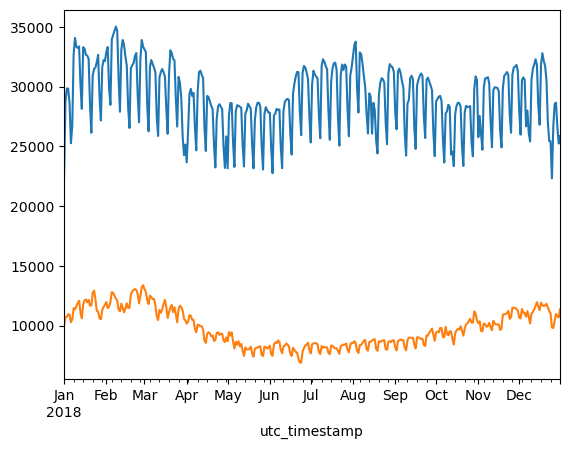

In [36]:
df_60_daily_load_actual['ES'].loc['2018-01-01':'2018-12-31'].plot()
df_60_daily_load_actual['FI'].loc['2018-01-01':'2018-12-31'].plot()

In [42]:
# fit ARIMA models on each country load actual 
import logging
import joblib

import pmdarima as pm

logging.getLogger('statsmodels').setLevel(logging.WARNING)
model_dirs = {
    'ARIMA':'arima_models',
    'SARIMA':'sarima_models',
    'GARCH':'garch_models'
}

def grid_search_sarima_params(df_series:pd.Series):
    model = pm.auto_arima(
        df_series.fillna(df_series.mean()) ,                # Replace 'FI' with your target variable
        start_p=1, start_q=1,    # Initial range for non-seasonal p and q
        max_p=3, max_q=3,        # Upper bound for non-seasonal p and q
        d=1,                     # Non-seasonal differencing
        start_P=1, start_Q=1,    # Initial range for seasonal P and Q
        max_P=2, max_Q=2,        # Upper bound for seasonal P and Q
        D=1,                     # Seasonal differencing
        m=7,                     # Seasonal period (e.g., weekly seasonality)
        seasonal=True,           # Enable seasonal ARIMA
        trace=True,              # Print progress
        error_action='ignore',   # Ignore if a configuration fails
        suppress_warnings=True,  # Suppress warnings
        stepwise=True            # Use stepwise search to reduce computation time
    )
    return model


def fit_arima(df:pd.DataFrame, name:str, model_type='ARIMA') -> None:

    assert model_type in model_dirs.keys()
    armia_dir = model_dirs.get(model_type)
    if not os.path.exists(os.path.join(cache_dir, armia_dir)):
        os.makedirs(os.path.join(cache_dir, armia_dir))
    print(f'Fitting {model_type} models for:', name)
    #remove '_load_actual_entsoe_transparency' from column names
    df.columns = [col.replace('_load_actual_entsoe_transparency', '') for col in df.columns]
    for col in df.columns:
        print(f'Fitting {model_type} model for:', col)
        #suppresss output
        if model_type == 'ARIMA':
            model = SARIMAX(df[col].dropna(), order=(1,1,1))
            model_fit = model.fit()
            model_fit.save(os.path.join(cache_dir, armia_dir, name + '_' + col + f'_{model_type.lower()}_model.pkl'))
        elif model_type == 'SARIMA':
            #parameters
            model_fit = grid_search_sarima_params(df[col])
            joblib.dump(model_fit, os.path.join(cache_dir, armia_dir, name + '_' + col + f'_{model_type.lower()}_model.pkl'))

        else:
            raise NotImplementedError(f'Not implemented for model_type = {model_type}')
        



In [38]:
fit_arima(df_60_daily_load_actual.loc['2018-01-01':'2018-12-31'], 'daily_load_actual')
fit_arima(df_60_load_actual.loc['2018-01-01':'2018-12-31'], '60_load_actual')

Fitting ARIMA models for: daily_load_actual
Fitting ARIMA model for: AT
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.02897D+00    |proj g|=  9.89226D-02

At iterate    5    f=  7.94350D+00    |proj g|=  1.54903D-02

At iterate   10    f=  7.94267D+00    |proj g|=  3.40554D-04

At iterate   15    f=  7.94239D+00    |proj g|=  7.81951D-03

At iterate   20    f=  7.93400D+00    |proj g|=  3.54034D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     31      1     

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  7.35563D+00    |proj g|=  3.14702D-02

At iterate   20    f=  7.35245D+00    |proj g|=  1.14662D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     26      1     0     0   4.654D-08   7.352D+00
  F =   7.3524537604381583     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: CY
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.02681D+00    |proj g|=  1.01461D-01

At iterate    5    f=  4.97567D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.00523D+01    |proj g|=  2.54275D-05

At iterate   25    f=  1.00522D+01    |proj g|=  7.54161D-04

At iterate   30    f=  1.00452D+01    |proj g|=  1.20730D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     47      1     0     0   5.824D-06   1.005D+01
  F =   10.045128179046571     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: DE_50hertz
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.48585D+0

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.06842D+00    |proj g|=  8.07029D-02

At iterate    5    f=  8.99378D+00    |proj g|=  2.38144D-03

At iterate   10    f=  8.99271D+00    |proj g|=  8.65308D-05

At iterate   15    f=  8.99211D+00    |proj g|=  9.28769D-04

At iterate   20    f=  8.98807D+00    |proj g|=  2.41687D-04

At iterate   25    f=  8.98582D+00    |proj g|=  5.98463D-03

At iterate   30    f=  8.98561D+00    |proj g|=  3.53069D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  8.86104D+00    |proj g|=  4.54836D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     50      1     0     0   4.473D-07   8.861D+00
  F =   8.8610347683404029     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: DE_transnetbw
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.37373D+00    |proj g|=  4.33378D-02

At iterate    5    f=  8.27162D+00    |proj g|=  4.70306D-03

At iterate   10    f=  8.26962

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  5.84275D+00    |proj g|=  1.61825D-03

At iterate   10    f=  5.83874D+00    |proj g|=  1.07332D-02

At iterate   15    f=  5.83668D+00    |proj g|=  1.32000D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     22      1     0     0   1.794D-08   5.837D+00
  F =   5.8366765329418904     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: EE
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.67803D+00    |pr

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     28      1     0     0   5.712D-06   7.427D+00
  F =   7.4267019449024714     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: FR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.66242D+00    |proj g|=  6.35761D-02

At iterate    5    f=  9.64004D+00    |proj g|=  5.37864D-02

At iterate   10    f=  9.63114D+00    |proj g|=  9.96410D-04

           * * *

Tit   = total number of

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  7.18970D+00    |proj g|=  1.40172D-02

At iterate   10    f=  7.18904D+00    |proj g|=  2.36202D-04

At iterate   15    f=  7.18813D+00    |proj g|=  4.85876D-03

At iterate   20    f=  7.18734D+00    |proj g|=  3.64410D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     28      1     0     0   4.149D-06   7.187D+00
  F =   7.1873429757492149     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: HR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are ex

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  7.22223D+00    |proj g|=  1.42966D-02

At iterate   10    f=  7.21473D+00    |proj g|=  1.88605D-04

At iterate   15    f=  7.21470D+00    |proj g|=  2.38100D-03

At iterate   20    f=  7.21376D+00    |proj g|=  3.74592D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     33      1     0     0   4.161D-06   7.214D+00
  F =   7.2136082612053851     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IE
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are ex

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  7.54070D+00    |proj g|=  8.34806D-03

At iterate   10    f=  7.53761D+00    |proj g|=  4.02078D-04

At iterate   15    f=  7.53360D+00    |proj g|=  2.45646D-03

At iterate   20    f=  7.52277D+00    |proj g|=  7.97442D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     27      1     0     0   7.974D-06   7.523D+00
  F =   7.5227651803003051     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IT_CSUD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  9.37279D+00    |proj g|=  2.23796D-02

At iterate   30    f=  9.37121D+00    |proj g|=  4.44427D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     36      1     0     0   4.444D-06   9.371D+00
  F =   9.3712101281068634     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IT_SARD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.60854D+00    |proj g|=  1.10004D-01

At iterate    5    f=  5.58204D+00  

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  6.13650D+00    |proj g|=  6.96842D-03

At iterate   15    f=  6.13418D+00    |proj g|=  6.85358D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     20      1     0     0   1.812D-06   6.134D+00
  F =   6.1341759976259631     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IT_SUD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.84776D+00    |proj g|=  1.11422D-01

At iterate    5    f=  6.80990D+00   

 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  7.88831D+00    |proj g|=  6.06889D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     27      1     0     0   8.067D-06   7.888D+00
  F =   7.8882378389254511     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: NO_1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.06857D+00    |proj g|=  7.15556D-02

At iterate    5    f=  7.06170D+00    |proj g|=  9.89253D-03

At iterate   10    f=  7.06153D+00    |

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  8.87381D+00    |proj g|=  2.81781D-03

At iterate   10    f=  8.87356D+00    |proj g|=  7.61508D-05

At iterate   15    f=  8.87355D+00    |proj g|=  2.18683D-03

At iterate   20    f=  8.87268D+00    |proj g|=  2.13343D-02

At iterate   25    f=  8.86769D+00    |proj g|=  1.62125D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     31      1     0     0   8.747D-07   8.868D+00
  F =   8.8676470197283077     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: PT
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =      

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     32      1     0     0   6.441D-07   7.515D+00
  F =   7.5152131017180297     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: RO
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.54738D+00    |proj g|=  1.12773D-01

At iterate    5    f=  7.50190D+00    |proj g|=  1.06902D-03

At iterate   10    f=  7.50180D+00    |proj g|=  1.57632D-03

At iterate   15    f=  7.49968D+00    |pr

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   15    f=  5.94782D+00    |proj g|=  8.63333D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     20      1     0     0   1.123D-07   5.948D+00
  F =   5.9478242983088547     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: SE_2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.47962D+00    |proj g|=  7.36684D-02

At iterate    5    f=  6.47399D+00    |proj g|=  4.05800D-04

At iterate   10    f=  6.47386D+00    |p

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  6.25376D+00    |proj g|=  1.59322D-02

At iterate   20    f=  6.25201D+00    |proj g|=  1.05831D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     27      1     0     0   5.807D-07   6.252D+00
  F =   6.2520037519468366     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: SK
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.69969D+00    |proj g|=  4.94281D-02

At iterate    5    f=  6.65122D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.84936D+00    |proj g|=  6.83733D-02

At iterate    5    f=  6.84703D+00    |proj g|=  3.99513D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   3.995D-05   6.847D+00
  F =   6.8470288191386048     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: BE


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.98839D+00    |proj g|=  1.35711D-02

At iterate    5    f=  6.98824D+00    |proj g|=  1.84412D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   1.844D-05   6.988D+00
  F =   6.9882377178352764     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: BG
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =    

 This problem is unconstrained.



At iterate    5    f=  6.28354D+00    |proj g|=  2.67924D-04

At iterate   10    f=  6.28345D+00    |proj g|=  4.57289D-03

At iterate   15    f=  6.28322D+00    |proj g|=  8.35640D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     18      1     0     0   4.696D-06   6.283D+00
  F =   6.2832224913805330     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: CH
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.92667D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.92667D+00    |proj g|=  2.38265D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   1.564D-06   6.927D+00
  F =   6.9266671966591584     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: CY
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.30457D+00    |proj g|=  2.66041D-02

At iterate    5    f=  4.30404D+00    |proj g|=  1.02701D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   10    f=  4.30395D+00    |proj g|=  1.89776D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     14      1     0     0   2.872D-06   4.304D+00
  F =   4.3039471450014544     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: CZ
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.78821D+00    |proj g|=  1.26849D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.78802D+00    |proj g|=  2.13084D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      9      1     0     0   2.130D-05   6.788D+00
  F =   6.7880151918597633     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: DE
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.72458D+00    |proj g|=  3.79423D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  8.72364D+00    |proj g|=  5.81331D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   5.813D-06   8.724D+00
  F =   8.7236390534029820     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: DE_50hertz
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.47397D+00    |proj g|=  1.03815D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  7.47397D+00    |proj g|=  3.62412D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   3.624D-06   7.474D+00
  F =   7.4739672780460555     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: DE_LU
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.82444D+00    |proj g|=  7.52696D-02

At iterate    5    f=  8.81958D+00    |proj g|=  1.86925D-04

           * * *

Tit   = total number

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Fitting ARIMA model for: DE_amprion
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.78247D+00    |proj g|=  1.92309D-02

At iterate    5    f=  7.78228D+00    |proj g|=  3.25385D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   1.018D-05   7.782D+00
  F =   7.7822758063059538     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: DE_tennet
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Fitting ARIMA model for: DE_transnetbw
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.81039D+00    |proj g|=  9.50456D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.81032D+00    |proj g|=  1.55024D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   1.550D-05   6.810D+00
  F =   6.8103185708716962     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: DK
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.55739D+00    |proj g|=  2.04912D-03

At iterate    5    f=  6.55739D+00    |proj g|=  3.44098D-06

           * * *

Tit   = total number of

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


Fitting ARIMA model for: DK_1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.18939D+00    |proj g|=  3.77990D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3      5      1     0     0   3.449D-06   6.189D+00
  F =   6.1893894767746112     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: DK_2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 var

 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  5.69904D+00    |proj g|=  4.35758D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   4.358D-06   5.699D+00
  F =   5.6990368504487492     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: EE
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.79643D+00    |proj g|=  3.98070D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  4.79539D+00    |proj g|=  4.66644D-04

At iterate   10    f=  4.79535D+00    |proj g|=  2.20952D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     15      1     0     0   8.818D-06   4.795D+00
  F =   4.7953430309810887     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: ES
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.20752D+00    |proj g|=  1.36788D-02

           * * *

Tit   = total number of

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Fitting ARIMA model for: FI
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.68752D+00    |proj g|=  1.93990D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.68683D+00    |proj g|=  7.26944D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   2.823D-05   6.687D+00
  F =   6.6868271079119319     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: FR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.79938D+00    |proj g|=  1.98001D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  8.79848D+00    |proj g|=  8.00053D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   8.001D-06   8.798D+00
  F =   8.7984792746381721     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: GB_GBN
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.09229D+00    |proj g|=  5.04727D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4      7      1     0     0   5.249D-06   9.092D+00
  F =   9.0921801338171839     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: GB_NIR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.23206D+00    |proj g|=  3.75539D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  5.23008D+00    |proj g|=  1.33164D-04

At iterate   10    f=  5.23007D+00    |proj g|=  2.86192D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     14      1     0     0   9.241D-07   5.230D+00
  F =   5.2300672003375839     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: GB_UKM
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.10136D+00    |proj g|=  5.33746D-03

           * * *

Tit   = total numbe

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Fitting ARIMA model for: GR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.75388D+00    |proj g|=  1.61573D-02

At iterate    5    f=  6.75365D+00    |proj g|=  8.09762D-05


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   10    f=  6.75365D+00    |proj g|=  1.74064D-03

At iterate   15    f=  6.75358D+00    |proj g|=  2.09072D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     21      1     0     0   1.226D-05   6.754D+00
  F =   6.7535821727005887     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: HR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.80266D+00    |proj g|=  8.80825D-03

At iterate    5    f=  5.80258D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   10    f=  5.80250D+00    |proj g|=  6.06792D-03

At iterate   15    f=  5.80235D+00    |proj g|=  2.18956D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     19      1     0     0   1.687D-06   5.802D+00
  F =   5.8023489447714161     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: HU


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.29723D+00    |proj g|=  7.26250D-03

At iterate    5    f=  6.29719D+00    |proj g|=  1.06229D-04

At iterate   10    f=  6.29719D+00    |proj g|=  1.90348D-03

At iterate   15    f=  6.29715D+00    |proj g|=  2.40108D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     21      1     0     0   4.569D-06   6.297D+00
  F =   6.2971411206745689     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting 

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   10    f=  6.11507D+00    |proj g|=  3.22563D-03

At iterate   15    f=  6.11504D+00    |proj g|=  6.00480D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     17      1     0     0   6.005D-06   6.115D+00
  F =   6.1150388128414184     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IE_sem
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.33685D+00    |proj g|=  2.28561D-02

At iterate    5    f=  6.33571D+00   

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   10    f=  6.33563D+00    |proj g|=  4.64953D-03

At iterate   15    f=  6.33550D+00    |proj g|=  3.36016D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     19      1     0     0   4.022D-06   6.336D+00
  F =   6.3355030926120213     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IT
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.50959D+00    |proj g|=  3.41995D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  8.50954D+00    |proj g|=  4.14276D-04

At iterate   10    f=  8.50934D+00    |proj g|=  6.60375D-03

At iterate   15    f=  8.50915D+00    |proj g|=  1.01107D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     22      1     0     0   4.901D-07   8.509D+00
  F =   8.5091449946886968     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: IT_CNOR
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.55157D+00  

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4      6      1     0     0   4.735D-05   6.552D+00
  F =   6.5515683171927543     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: IT_CSUD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.82504D+00    |proj g|=  3.70961D-03


 This problem is unconstrained.



At iterate    5    f=  6.82502D+00    |proj g|=  3.86294D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      8      1     0     0   3.863D-05   6.825D+00
  F =   6.8250217576070522     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: IT_NORD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.10789D+00    |proj g|=  3.63462D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  8.10787D+00    |proj g|=  2.02947D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      9      1     0     0   2.029D-05   8.108D+00
  F =   8.1078725824395903     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: IT_SARD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.31868D+00    |proj g|=  1.87755D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)



At iterate    5    f=  5.31868D+00    |proj g|=  2.16716D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   2.167D-05   5.319D+00
  F =   5.3186761094718218     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: IT_SICI
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.98787D+00    |proj g|=  2.26173D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Fitting ARIMA model for: IT_SUD
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.57409D+00    |proj g|=  7.48034D-04

At iterate    5    f=  6.57409D+00    |proj g|=  1.15241D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   1.152D-06   6.574D+00
  F =   6.5740931779907772     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: LT
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  5.21287D+00    |proj g|=  2.97936D-04

At iterate   10    f=  5.21284D+00    |proj g|=  1.76000D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     16      1     0     0   2.686D-06   5.213D+00
  F =   5.2128294823758745     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: LU
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.05935D+00    |proj g|=  1.26097D-03

At iterate    5    f=  5.05934D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.77778D+00    |proj g|=  2.25730D-02

At iterate    5    f=  4.77740D+00    |proj g|=  7.24499D-04


 This problem is unconstrained.



At iterate   10    f=  4.77730D+00    |proj g|=  2.18933D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     15      1     0     0   6.896D-06   4.777D+00
  F =   4.7772857340705377     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: ME
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.30424D+00    |proj g|=  2.11346D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  4.30423D+00    |proj g|=  1.37499D-04

At iterate   10    f=  4.30423D+00    |proj g|=  4.09213D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     13      1     0     0   3.078D-06   4.304D+00
  F =   4.3042313469080460     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: NL


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.29791D+00    |proj g|=  5.99689D-02

At iterate    5    f=  7.29581D+00    |proj g|=  7.76669D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   7.767D-05   7.296D+00
  F =   7.2958053678198249     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: NO
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =    

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.45728D+00    |proj g|=  2.85979D-03

At iterate    5    f=  6.45727D+00    |proj g|=  4.55227D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   4.552D-06   6.457D+00
  F =   6.4572724521512228     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: NO_2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =  

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4      6      1     0     0   3.037D-06   6.413D+00
  F =   6.4126204975767056     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: NO_3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.96277D+00    |proj g|=  1.94035D-03


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)



At iterate    5    f=  5.96268D+00    |proj g|=  9.60743D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   9.607D-07   5.963D+00
  F =   5.9626781023035438     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: NO_4
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.62271D+00    |proj g|=  6.73056D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tni

 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


Fitting ARIMA model for: NO_5
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.75470D+00    |proj g|=  8.53098D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4      7      1     0     0   5.666D-06   5.755D+00
  F =   5.7546932568488289     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: PL
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 varia

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4      8      1     0     0   4.013D-05   7.683D+00
  F =   7.6834752618804600     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: PT
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.69104D+00    |proj g|=  3.63031D-02


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.68953D+00    |proj g|=  1.54278D-04

At iterate   10    f=  6.68951D+00    |proj g|=  4.28265D-03

At iterate   15    f=  6.68930D+00    |proj g|=  2.69526D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     20      1     0     0   2.470D-05   6.689D+00
  F =   6.6892974168257995     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: RO
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.61689D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.61543D+00    |proj g|=  1.49427D-04

At iterate   10    f=  6.61541D+00    |proj g|=  3.76217D-03

At iterate   15    f=  6.61524D+00    |proj g|=  1.62671D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     21      1     0     0   3.051D-07   6.615D+00
  F =   6.6152385217514951     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: RS
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.43540D+00    |pr

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.43535D+00    |proj g|=  1.72243D-04

At iterate   10    f=  6.43534D+00    |proj g|=  3.87459D-03

At iterate   15    f=  6.43519D+00    |proj g|=  4.67223D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     21      1     0     0   7.723D-06   6.435D+00
  F =   6.4351738113803991     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: SE


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.49034D+00    |proj g|=  1.01544D-02

At iterate    5    f=  7.49028D+00    |proj g|=  4.24094D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   7.259D-06   7.490D+00
  F =   7.4902803725680469     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: SE_1


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.80375D+00    |proj g|=  3.30669D-03

At iterate    5    f=  5.79714D+00    |proj g|=  3.09045D-02

At iterate   10    f=  5.77473D+00    |proj g|=  1.39838D-03

At iterate   15    f=  5.77325D+00    |proj g|=  1.42324D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     24      1     0     0   1.469D-06   5.773D+00
  F =   5.7732464057412001     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting 

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.16409D+00    |proj g|=  4.17339D-03

At iterate   10    f=  6.16398D+00    |proj g|=  1.43553D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     14      1     0     0   1.017D-05   6.164D+00
  F =   6.1639821399034638     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: SE_3


/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.88846D+00    |proj g|=  1.47957D-02

At iterate    5    f=  6.88826D+00    |proj g|=  3.81384D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   3.814D-05   6.888D+00
  F =   6.8882628422267711     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Fitting ARIMA model for: SE_4
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =  

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  6.06095D+00    |proj g|=  5.60316D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   5.603D-06   6.061D+00
  F =   6.0609472168066398     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Fitting ARIMA model for: SI
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.60739D+00    |proj g|=  9.28336D-03

At iterate    5    f=  5.60731D+00    |proj g|=  5.36343D-05

           * * *

Tit   = total number of

/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._

Fitting ARIMA model for: SK
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.88779D+00    |proj g|=  3.90962D-03

At iterate    5    f=  5.88778D+00    |proj g|=  2.49327D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   2.493D-05   5.888D+00
  F =   5.8877784670510263     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/home/dhunt/repos/learning/.venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Fitting ARIMA model for: UA
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.50177D+00    |proj g|=  7.19696D-03


 This problem is unconstrained.



At iterate    5    f=  7.50174D+00    |proj g|=  5.22613D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      7      1     0     0   5.226D-06   7.502D+00
  F =   7.5017425983771062     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


In [43]:
fit_arima(df_60_daily_load_actual.loc['2018-01-01':'2018-12-31'], 'daily_load_actual',model_type='SARIMA')
fit_arima(df_60_load_actual.loc['2018-01-01':'2018-12-31'], '60_load_actual',model_type='SARIMA')

Fitting SARIMA models for: daily_load_actual
Fitting SARIMA model for: AT
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,1,1)[7]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[7]             : AIC=5357.952, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[7]             : AIC=5270.706, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[7]             : AIC=inf, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[7]             : AIC=5344.709, Time=0.01 sec
 ARIMA(1,1,0)(2,1,0)[7]             : AIC=5217.598, Time=0.12 sec
 ARIMA(1,1,0)(2,1,1)[7]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(1,1,1)[7]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(2,1,0)[7]             : AIC=5233.525, Time=0.04 sec
 ARIMA(2,1,0)(2,1,0)[7]             : AIC=5212.195, Time=0.14 sec
 ARIMA(2,1,0)(1,1,0)[7]             : AIC=5268.319, Time=0.22 sec
 ARIMA(2,1,0)(2,1,1)[7]             : AIC=inf, Time=0.51 sec
 ARIMA(2,1,0)(1,1,1)[7]             : AIC=inf, Time=0.23 sec
 ARIMA(3,1,0)(2,1,0)[7]             : AIC=5212.227, Tim

KeyboardInterrupt: 

## Data is too Seasonal to have this work 

In [46]:
# display the results for just AT 
# load from cache
import statsmodels.api as sm
at_model = sm.load(os.path.join(cache_dir, 'arima_models', '60_load_actual_FI_arima_model.pkl'))
daily_model = sm.load(os.path.join(cache_dir, 'arima_models', 'daily_load_actual_FI_arima_model.pkl'))
sarima_model = joblib.load(os.path.join(cache_dir, 'sarima_models', '60_load_actual_FI_sarima_model.pkl'))
sarima_daily_model = joblib.load(os.path.join(cache_dir, 'sarima_models', 'daily_load_actual_FI_sarima_model.pkl'))

In [47]:
print(at_model.summary())
print(daily_model.summary())
print(sarima_model.summary())
print(sarima_daily_model.summary())

                               SARIMAX Results                                
Dep. Variable:                     FI   No. Observations:                 8760
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -58576.605
Date:                Thu, 31 Oct 2024   AIC                         117159.211
Time:                        23:51:43   BIC                         117180.444
Sample:                    01-01-2018   HQIC                        117166.446
                         - 12-31-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4001      0.015     26.152      0.000       0.370       0.430
ma.L1          0.3202      0.014     22.511      0.000       0.292       0.348
sigma2      3.788e+04    446.701     84.792      0.0

In [165]:
def generate_and_save_arima_plots(df:pd.DataFrame, name:str) -> None:
    arima_dir = 'arima_plots'
    if not os.path.exists(os.path.join(cache_dir, arima_dir)):
        os.makedirs(os.path.join(cache_dir, arima_dir))
    print('Generating ARIMA plots for:', name)
    #remove '_load_actual_entsoe_transparency' from column names
    df.columns = [col.replace('_load_actual_entsoe_transparency', '') for col in df.columns]
    print(df.columns)
    for col in df.columns:
        print('Generating ARIMA plot for:', col)
        model = sm.load(os.path.join(cache_dir, 'arima_models', name + '_' + col + '_arima_model.pkl'))
        fig = model.plot_diagnostics()
        fig.savefig(os.path.join(cache_dir, arima_dir, name + '_' + col + '_arima_plot.png'))
        #plt.show()
        plt.close(fig)

Generating ARIMA plots for: 60_load_actual
Index(['AT', 'BE', 'BG', 'CH', 'CY', 'CZ', 'DE', 'DE_50hertz', 'DE_LU',
       'DE_amprion', 'DE_tennet', 'DE_transnetbw', 'DK', 'DK_1', 'DK_2', 'EE',
       'ES', 'FI', 'FR', 'GB_GBN', 'GB_NIR', 'GB_UKM', 'GR', 'HR', 'HU', 'IE',
       'IE_sem', 'IT', 'IT_CNOR', 'IT_CSUD', 'IT_NORD', 'IT_SARD', 'IT_SICI',
       'IT_SUD', 'LT', 'LU', 'LV', 'ME', 'NL', 'NO', 'NO_1', 'NO_2', 'NO_3',
       'NO_4', 'NO_5', 'PL', 'PT', 'RO', 'RS', 'SE', 'SE_1', 'SE_2', 'SE_3',
       'SE_4', 'SI', 'SK', 'UA'],
      dtype='object')
Generating ARIMA plot for: AT


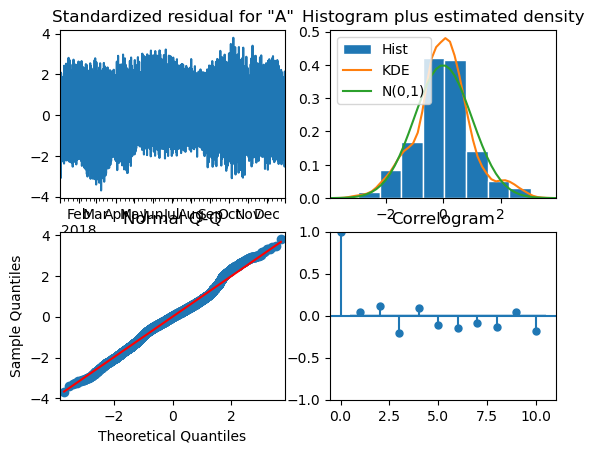

Generating ARIMA plot for: BE


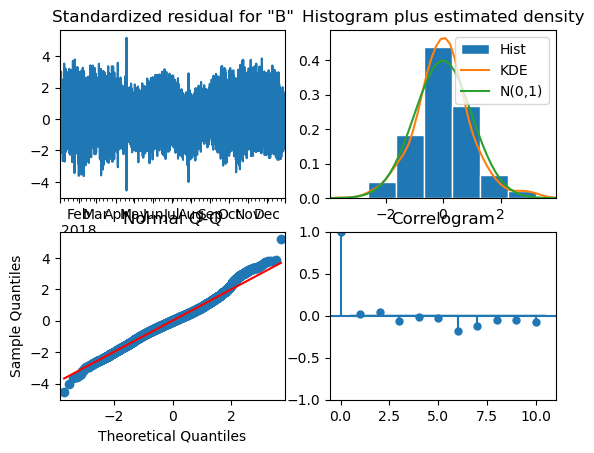

Generating ARIMA plot for: BG


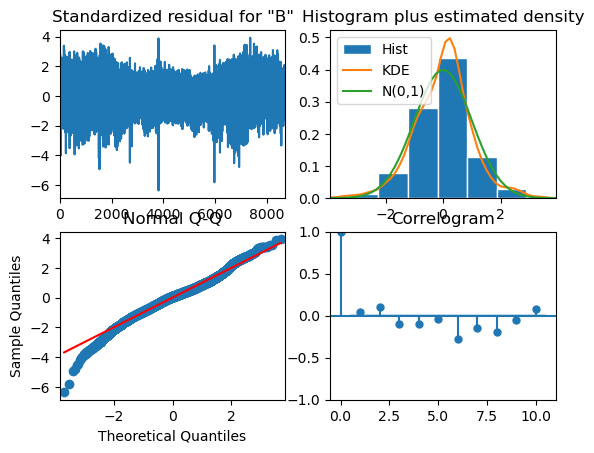

Generating ARIMA plot for: CH


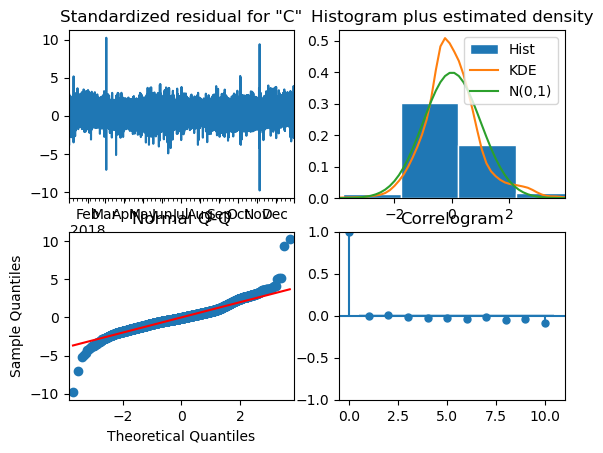

Generating ARIMA plot for: CY


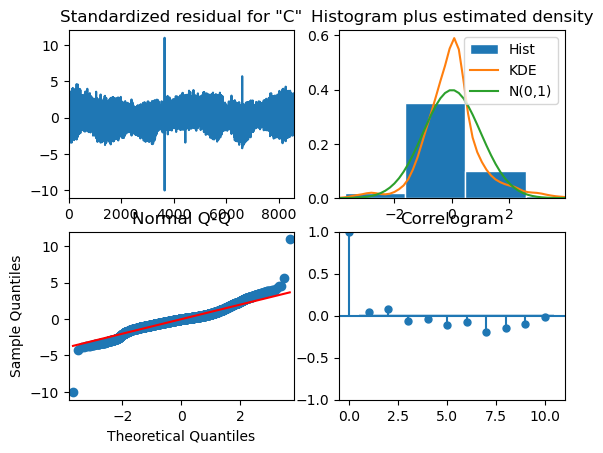

Generating ARIMA plot for: CZ


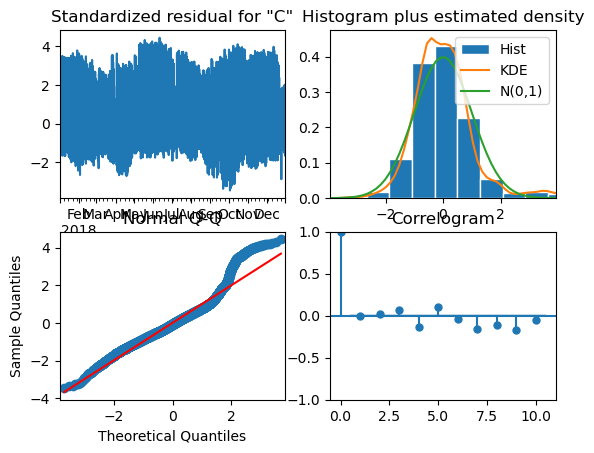

Generating ARIMA plot for: DE


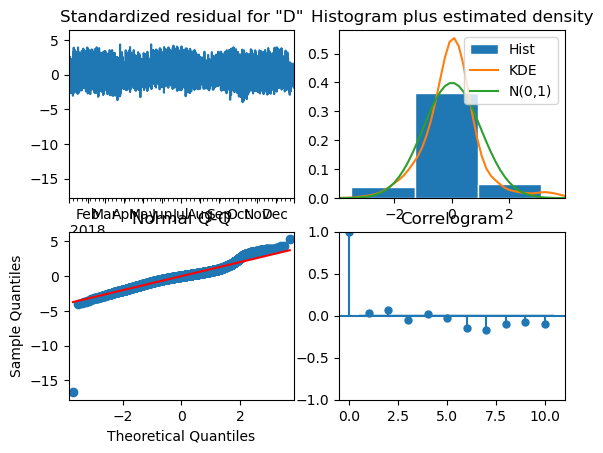

Generating ARIMA plot for: DE_50hertz


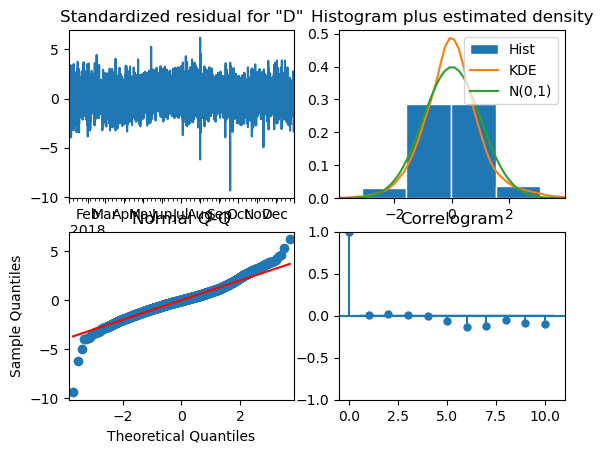

Generating ARIMA plot for: DE_LU


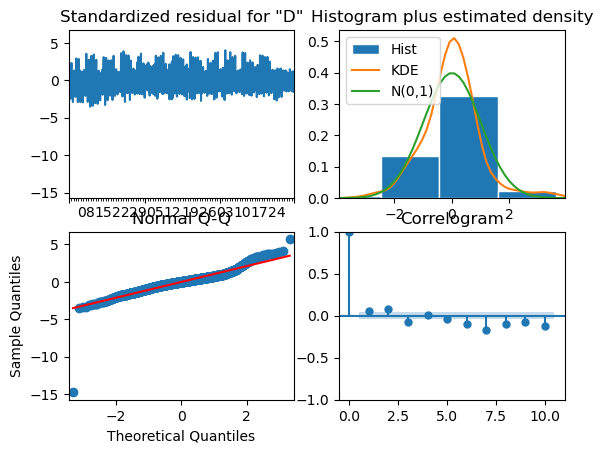

Generating ARIMA plot for: DE_amprion


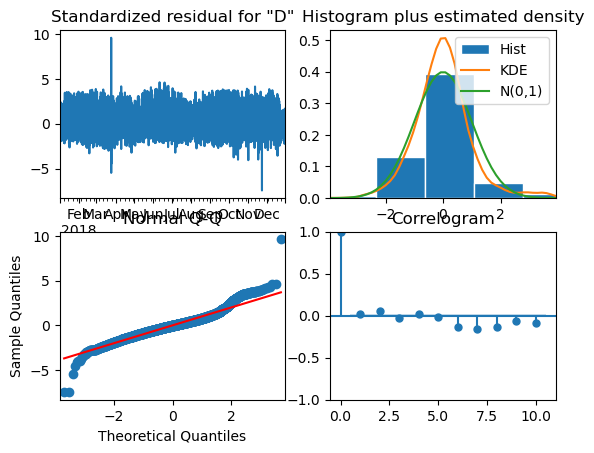

Generating ARIMA plot for: DE_tennet


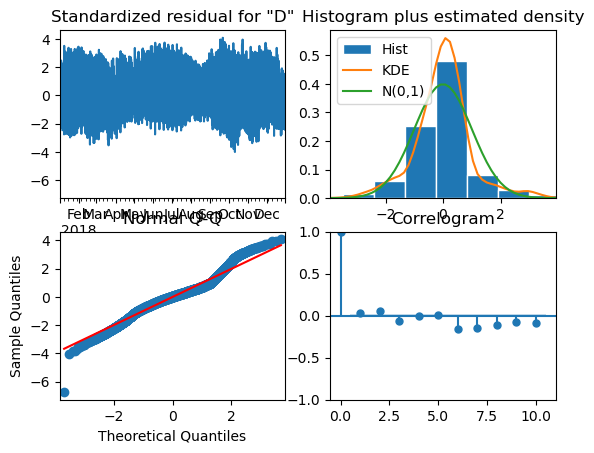

Generating ARIMA plot for: DE_transnetbw


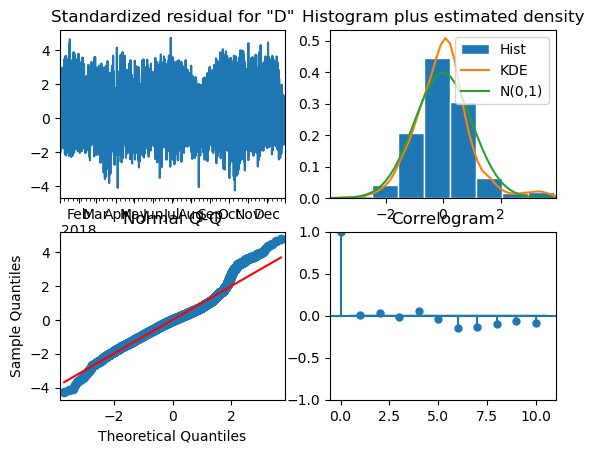

Generating ARIMA plot for: DK


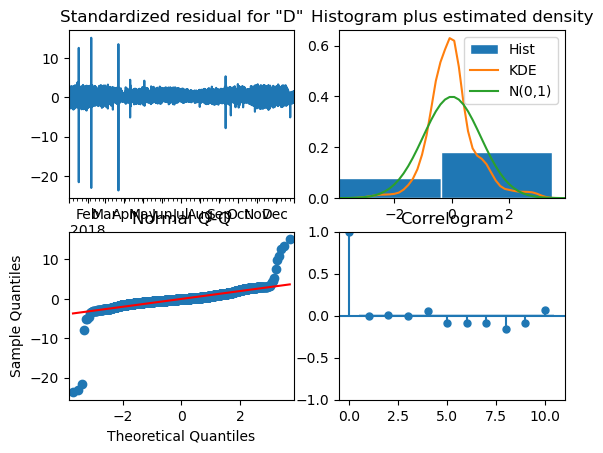

Generating ARIMA plot for: DK_1


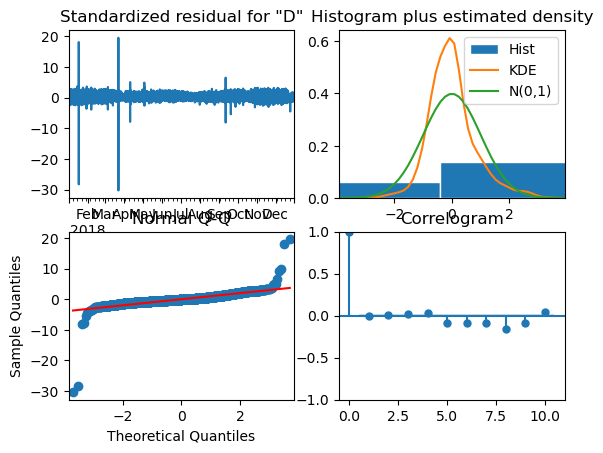

Generating ARIMA plot for: DK_2


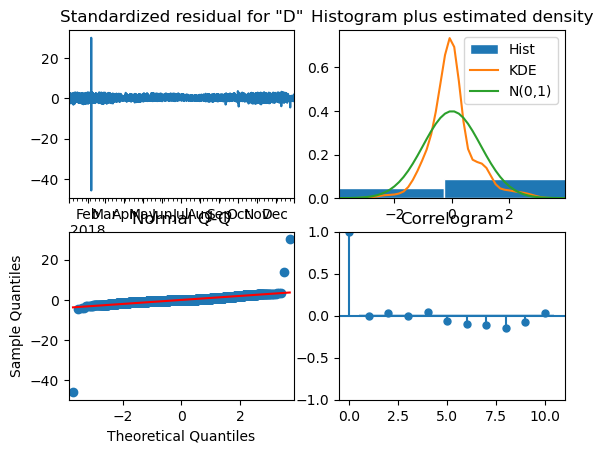

Generating ARIMA plot for: EE


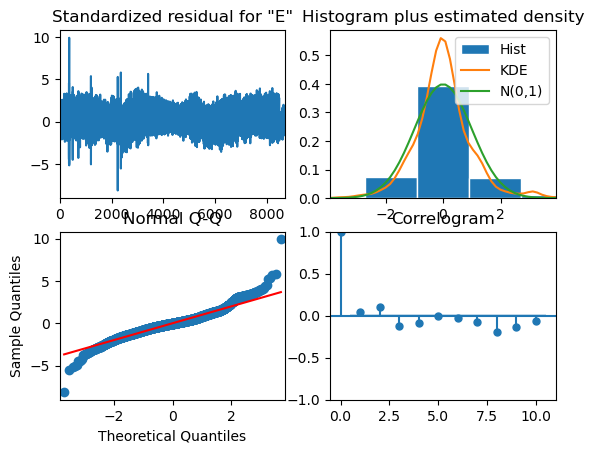

Generating ARIMA plot for: ES


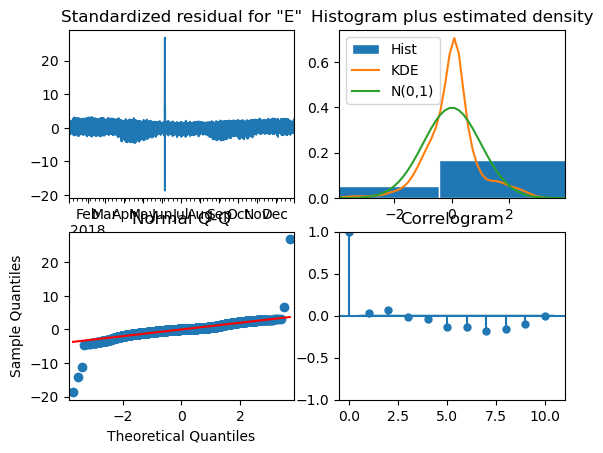

Generating ARIMA plot for: FI


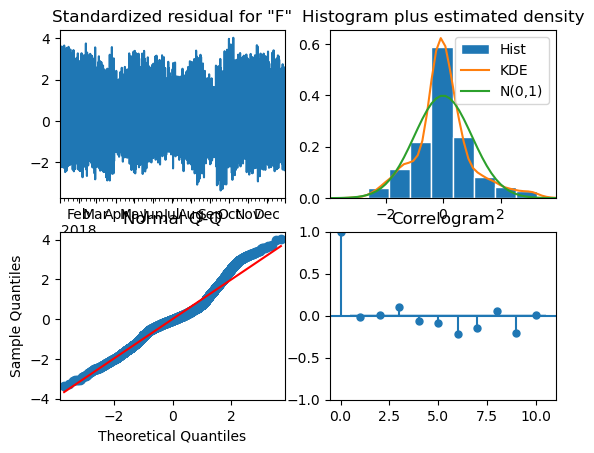

Generating ARIMA plot for: FR


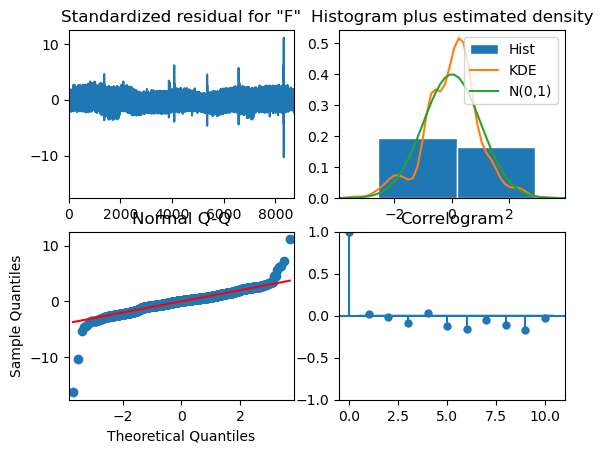

Generating ARIMA plot for: GB_GBN


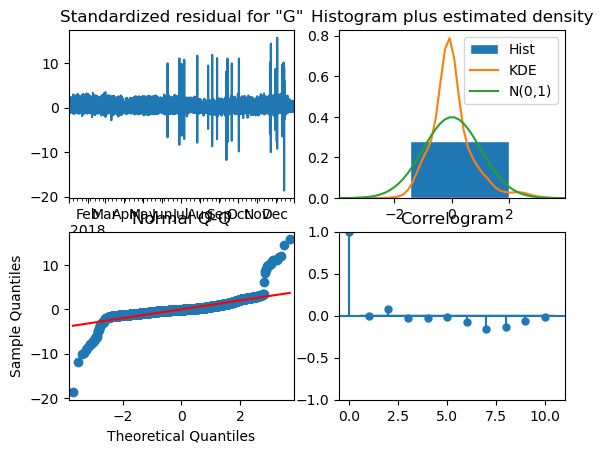

Generating ARIMA plot for: GB_NIR


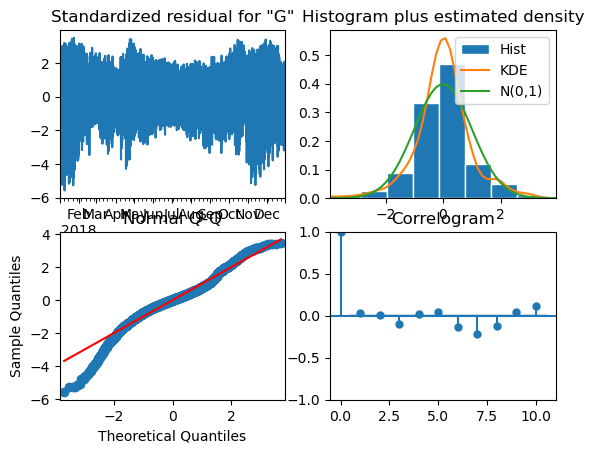

Generating ARIMA plot for: GB_UKM


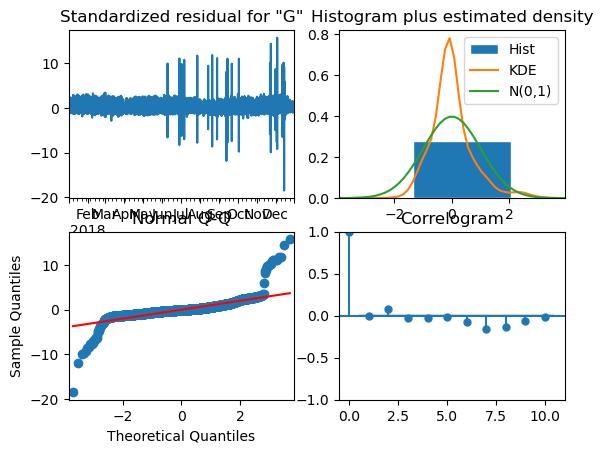

Generating ARIMA plot for: GR


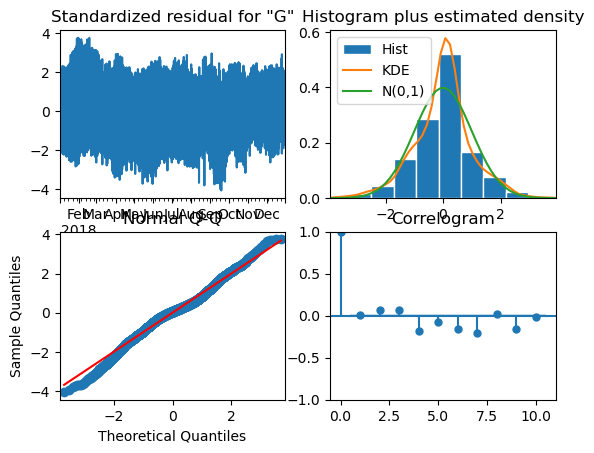

Generating ARIMA plot for: HR


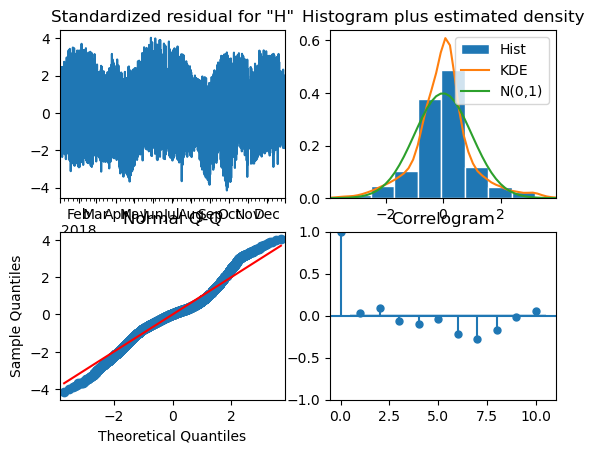

Generating ARIMA plot for: HU


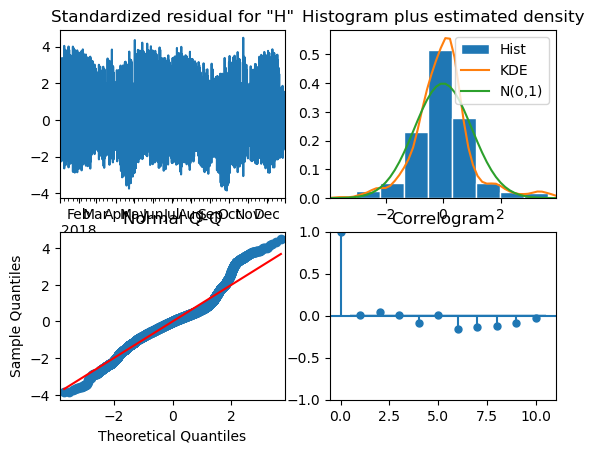

Generating ARIMA plot for: IE


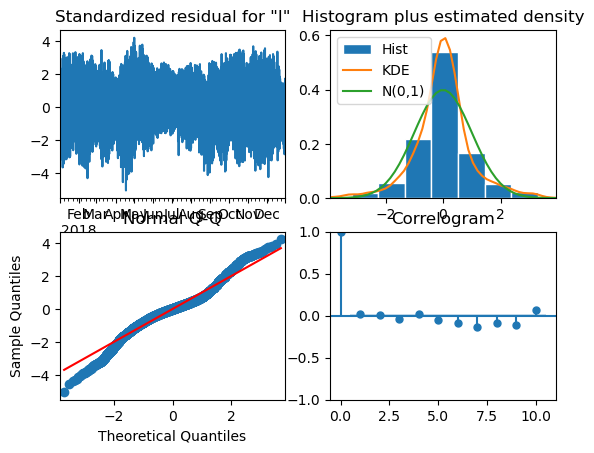

Generating ARIMA plot for: IE_sem


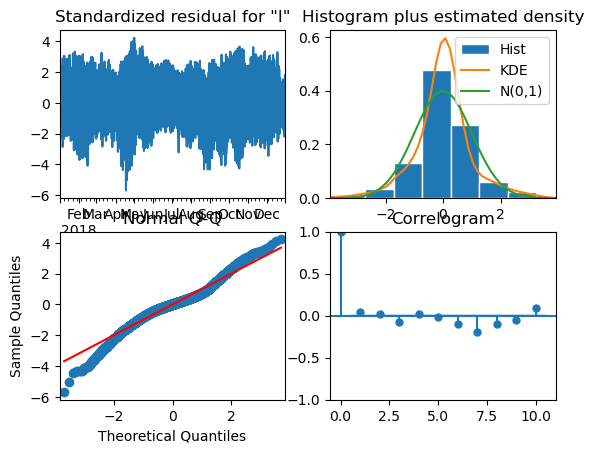

Generating ARIMA plot for: IT


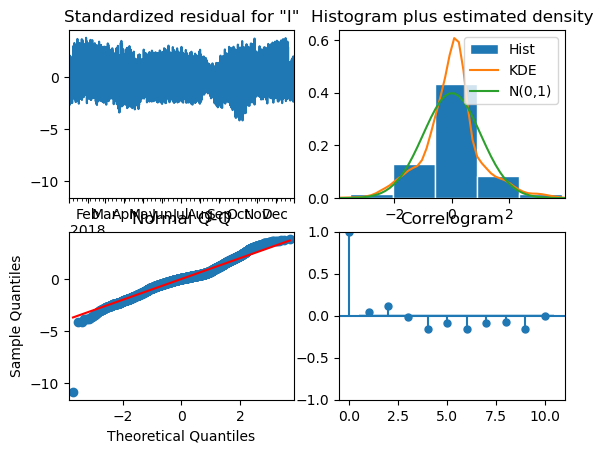

Generating ARIMA plot for: IT_CNOR


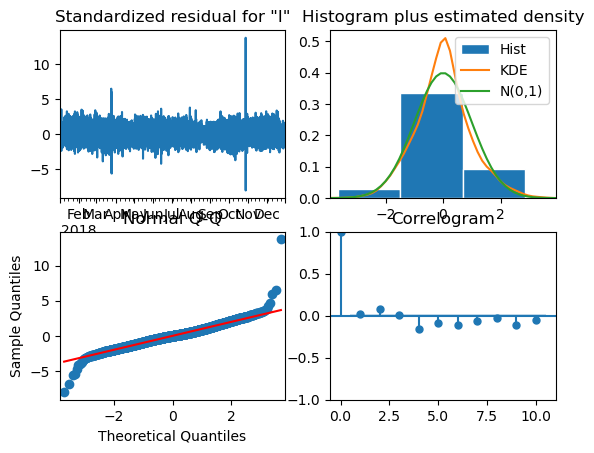

Generating ARIMA plot for: IT_CSUD


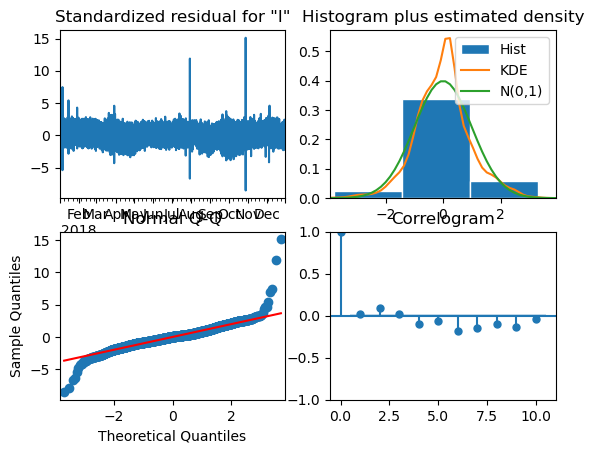

Generating ARIMA plot for: IT_NORD


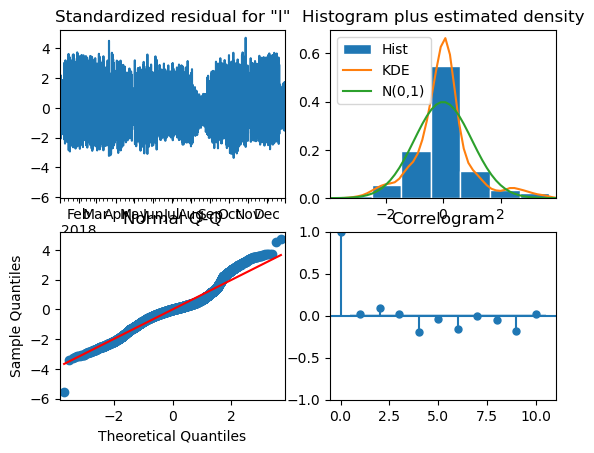

Generating ARIMA plot for: IT_SARD


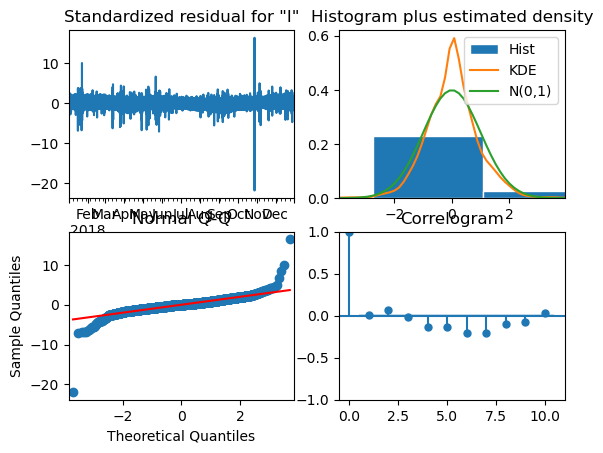

Generating ARIMA plot for: IT_SICI


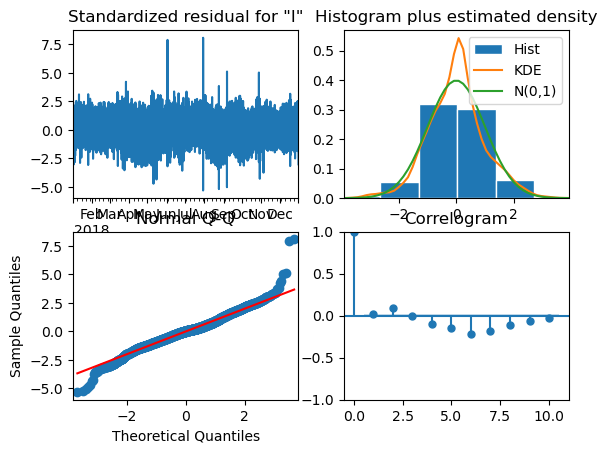

Generating ARIMA plot for: IT_SUD


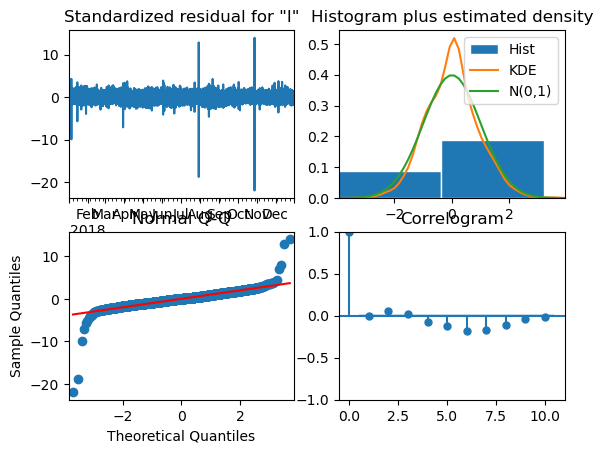

Generating ARIMA plot for: LT


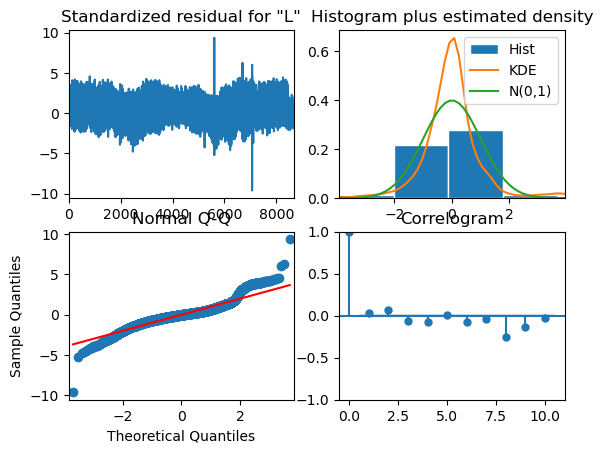

Generating ARIMA plot for: LU


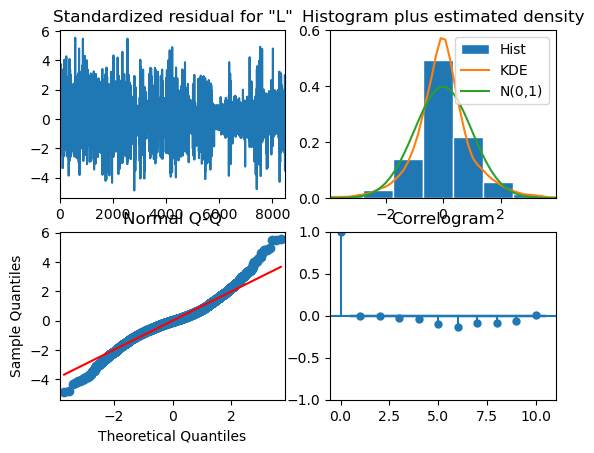

Generating ARIMA plot for: LV


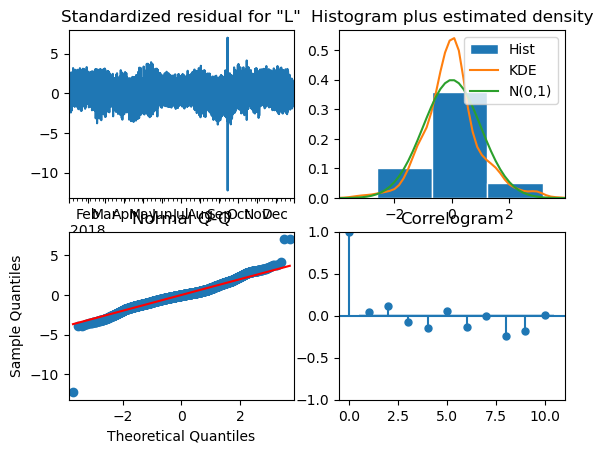

Generating ARIMA plot for: ME


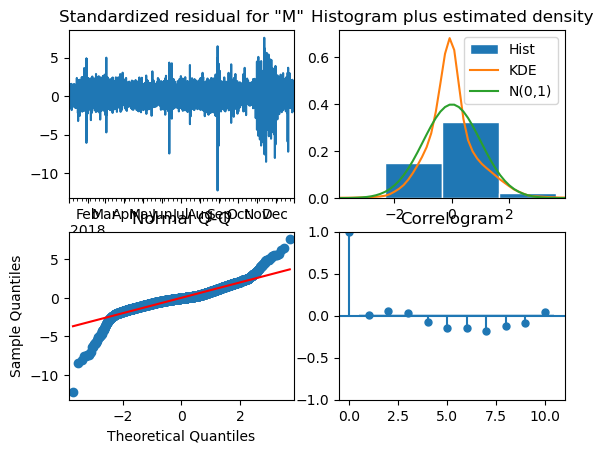

Generating ARIMA plot for: NL


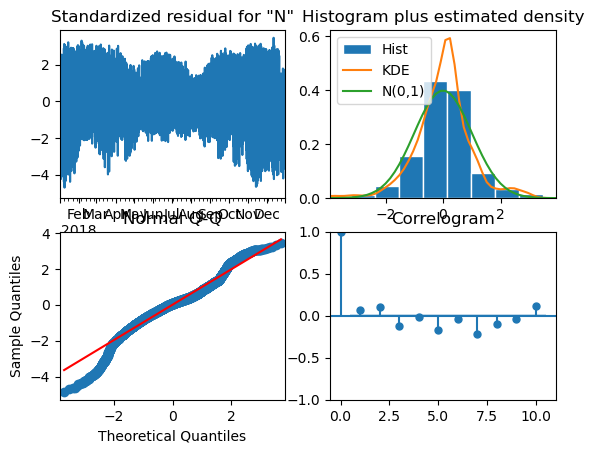

Generating ARIMA plot for: NO


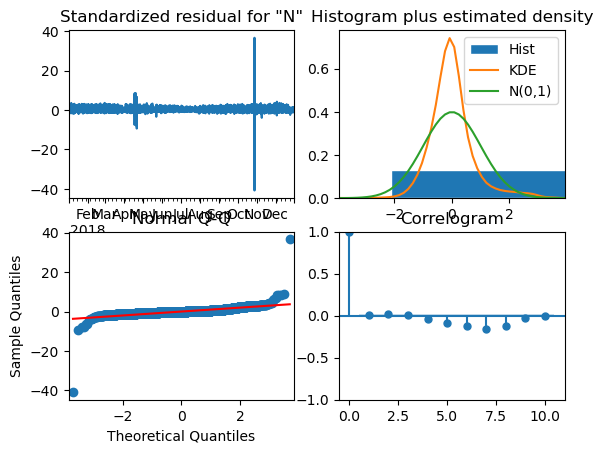

Generating ARIMA plot for: NO_1


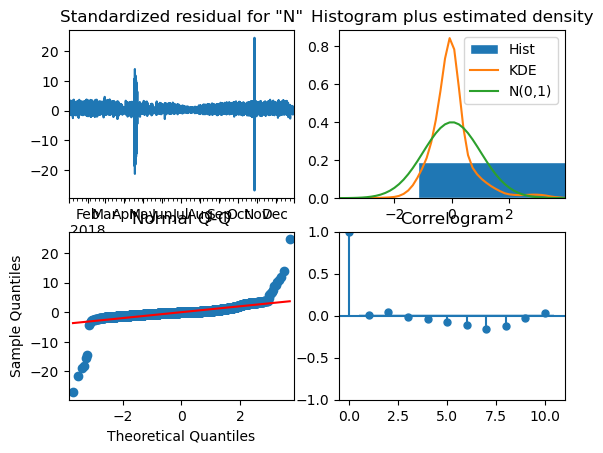

Generating ARIMA plot for: NO_2


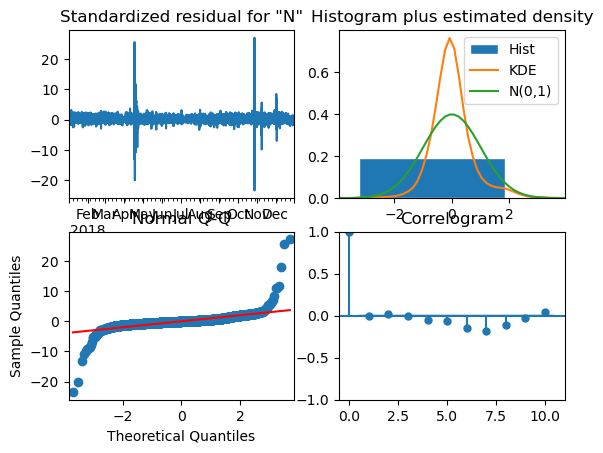

Generating ARIMA plot for: NO_3


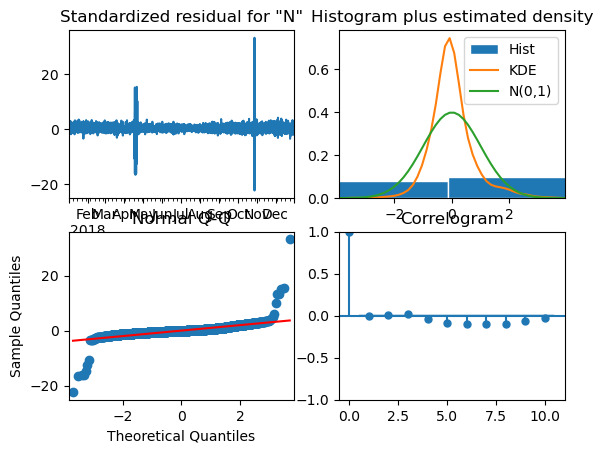

Generating ARIMA plot for: NO_4


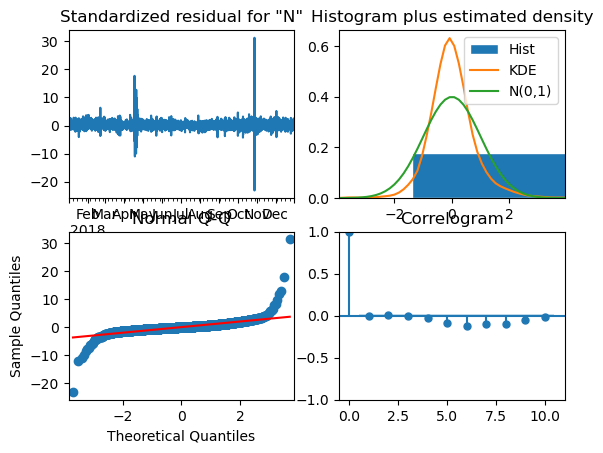

Generating ARIMA plot for: NO_5


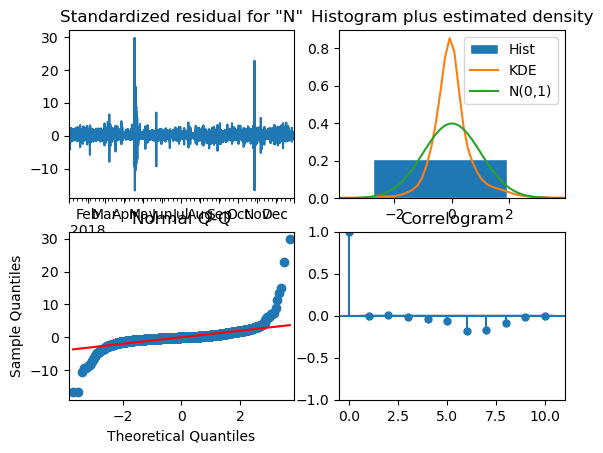

Generating ARIMA plot for: PL


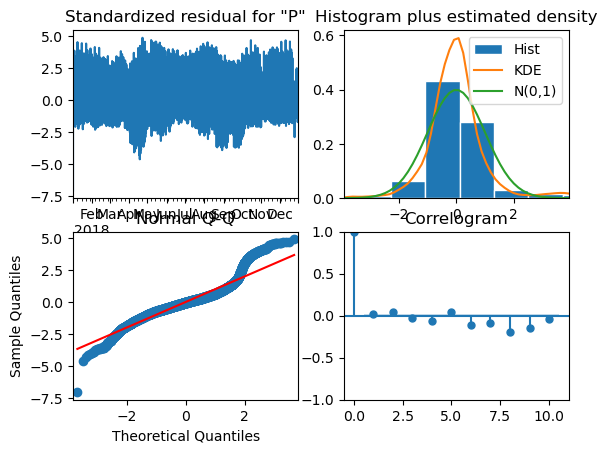

Generating ARIMA plot for: PT


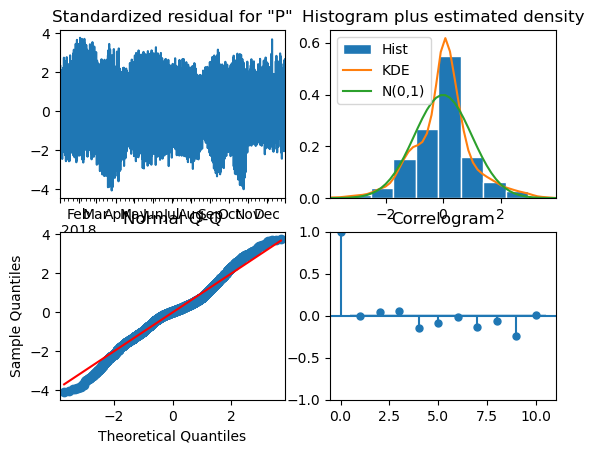

Generating ARIMA plot for: RO


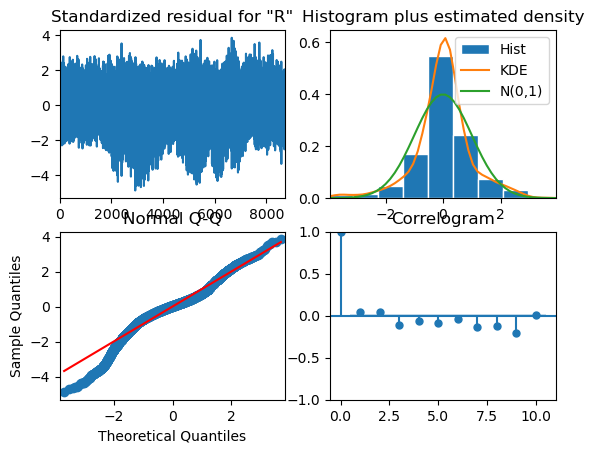

Generating ARIMA plot for: RS


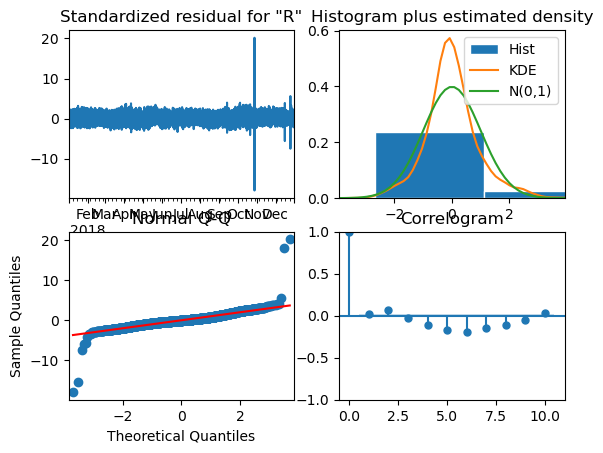

Generating ARIMA plot for: SE


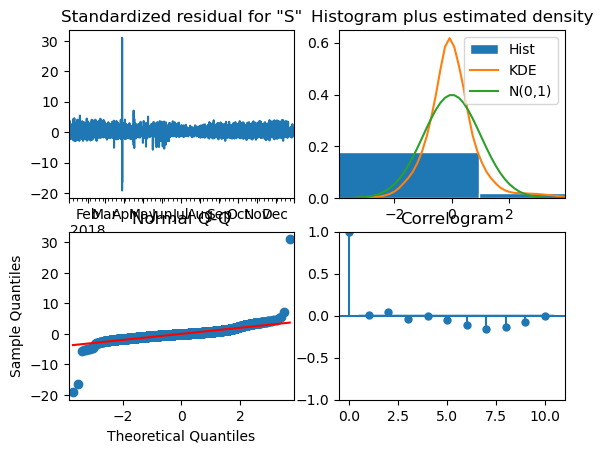

Generating ARIMA plot for: SE_1


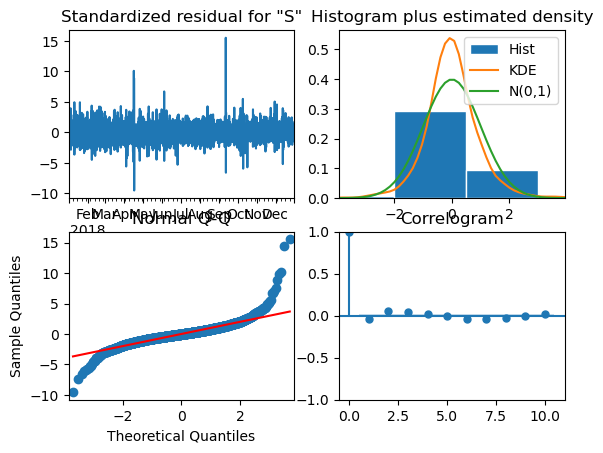

Generating ARIMA plot for: SE_2


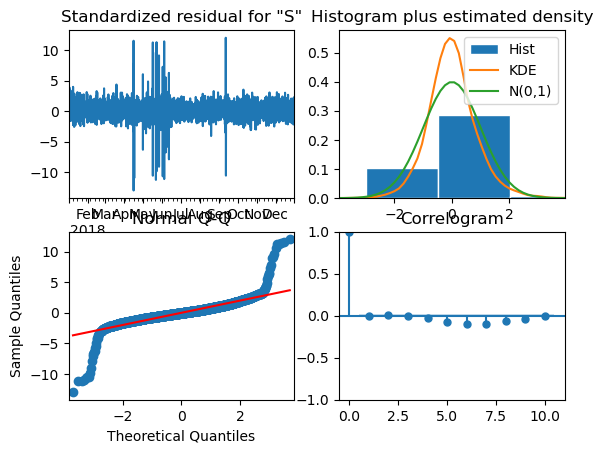

Generating ARIMA plot for: SE_3


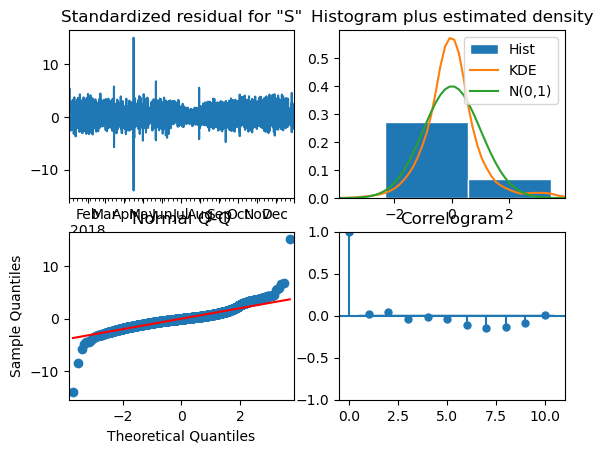

Generating ARIMA plot for: SE_4


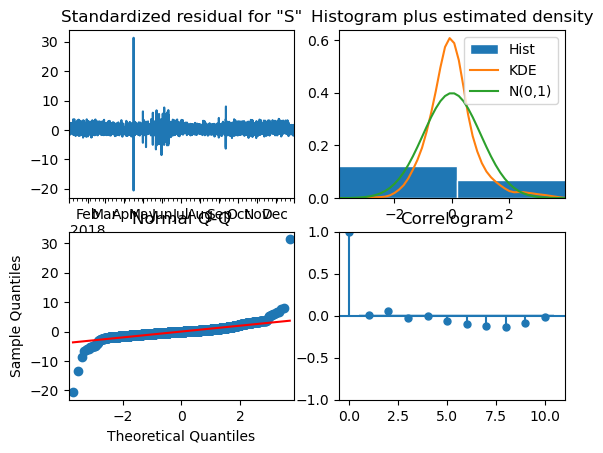

Generating ARIMA plot for: SI


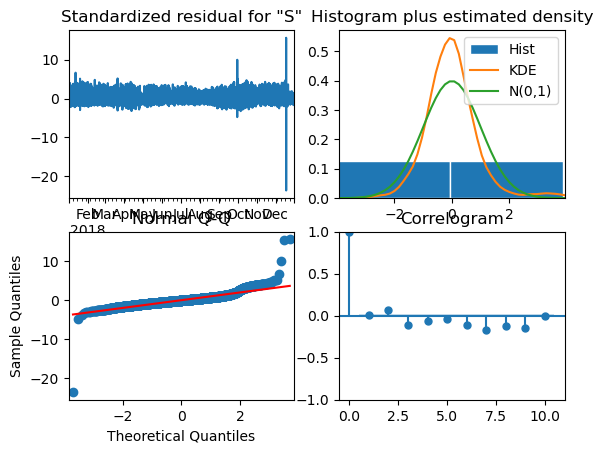

Generating ARIMA plot for: SK


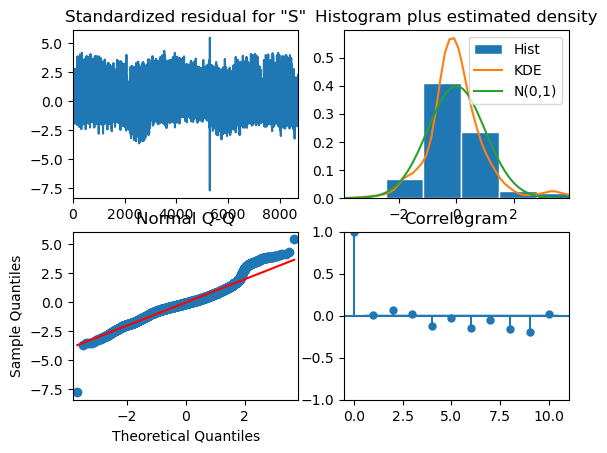

Generating ARIMA plot for: UA


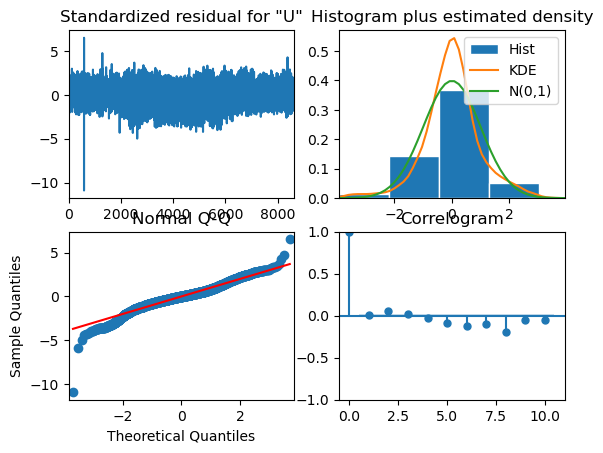

In [166]:
generate_and_save_arima_plots(df_60_load_actual, '60_load_actual')

Generating ARIMA plots for: daily_load_actual
Generating ARIMA plot for: AT


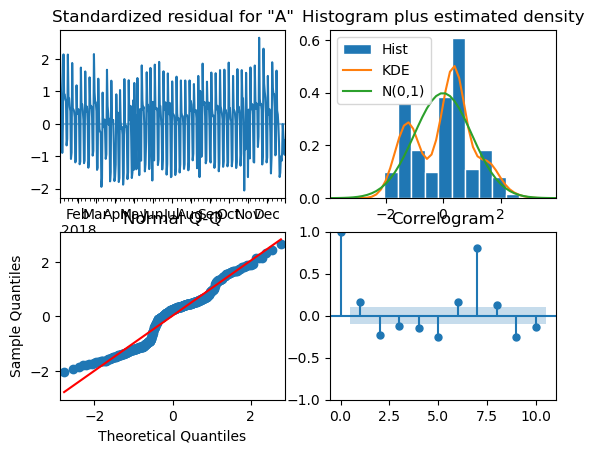

Generating ARIMA plot for: BE


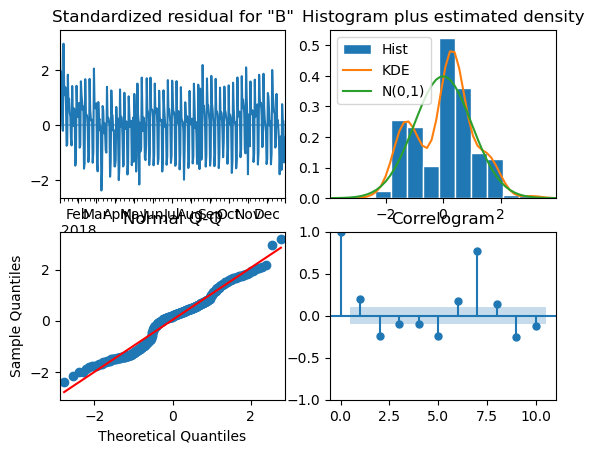

Generating ARIMA plot for: BG


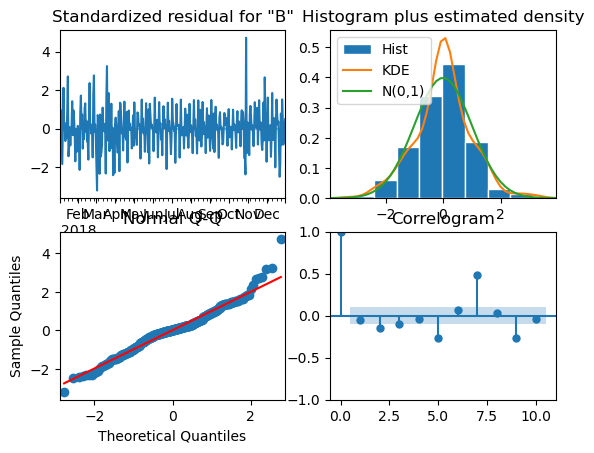

Generating ARIMA plot for: CH


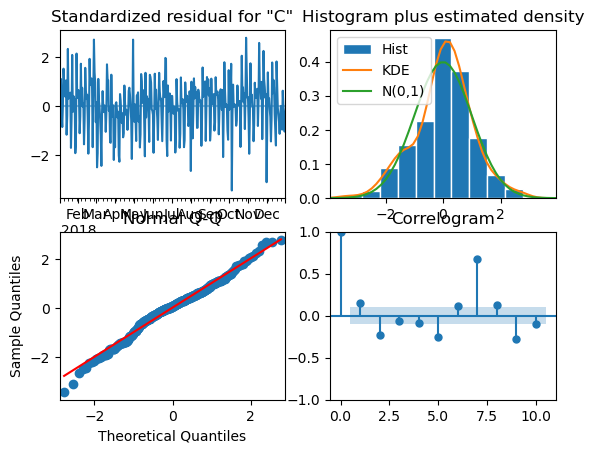

Generating ARIMA plot for: CY


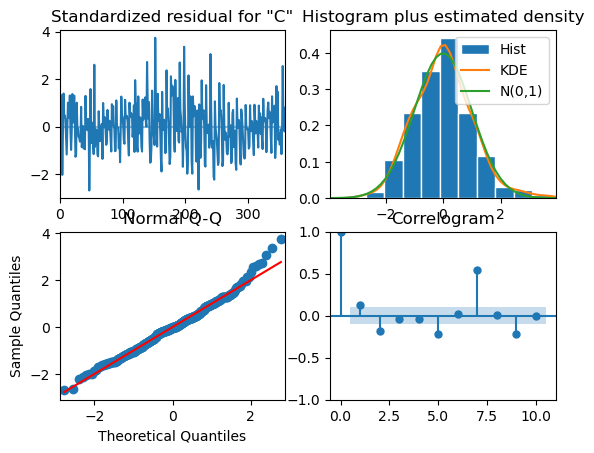

Generating ARIMA plot for: CZ


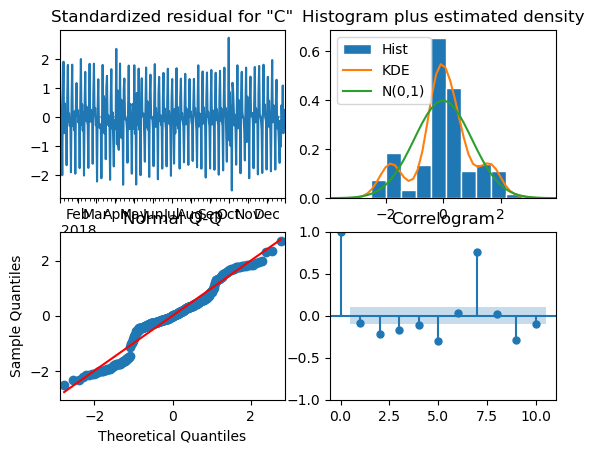

Generating ARIMA plot for: DE


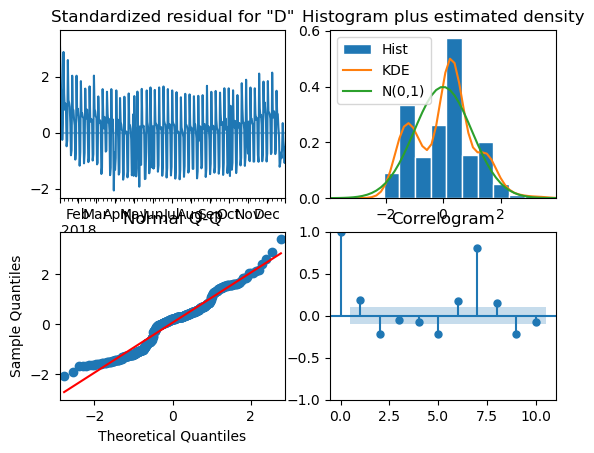

Generating ARIMA plot for: DE_50hertz


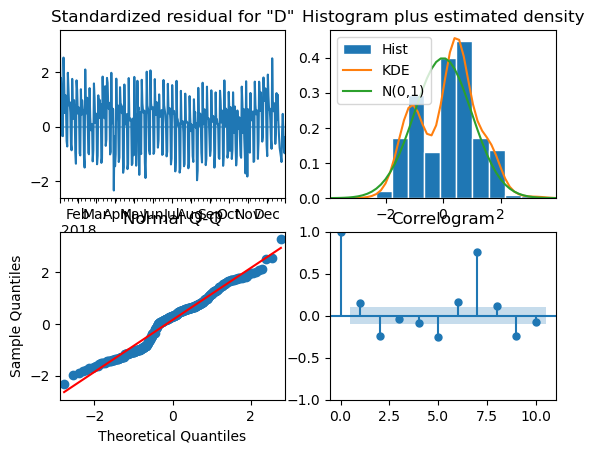

Generating ARIMA plot for: DE_LU


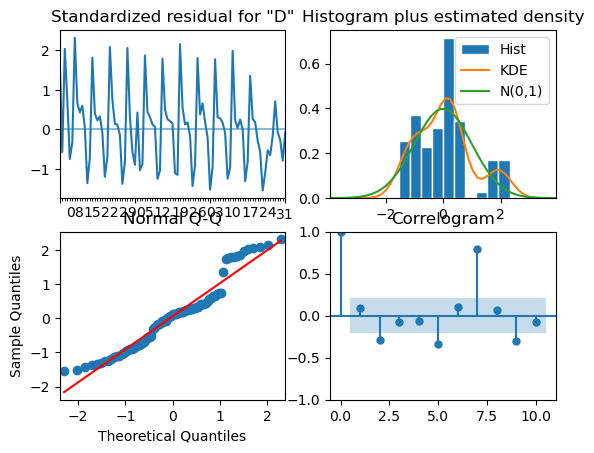

Generating ARIMA plot for: DE_amprion


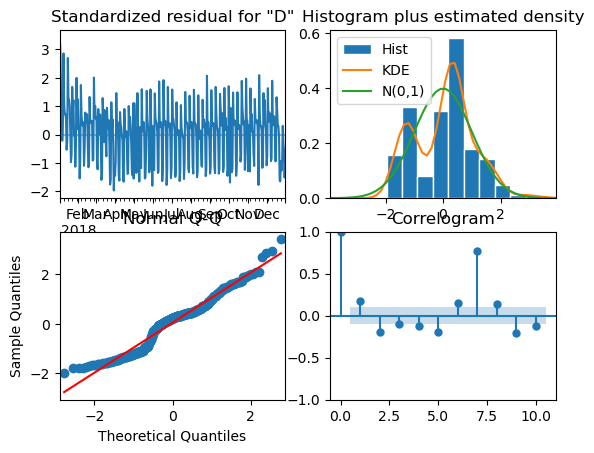

Generating ARIMA plot for: DE_tennet


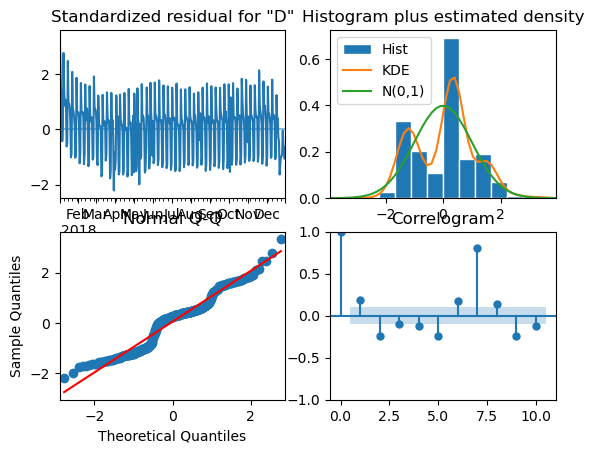

Generating ARIMA plot for: DE_transnetbw


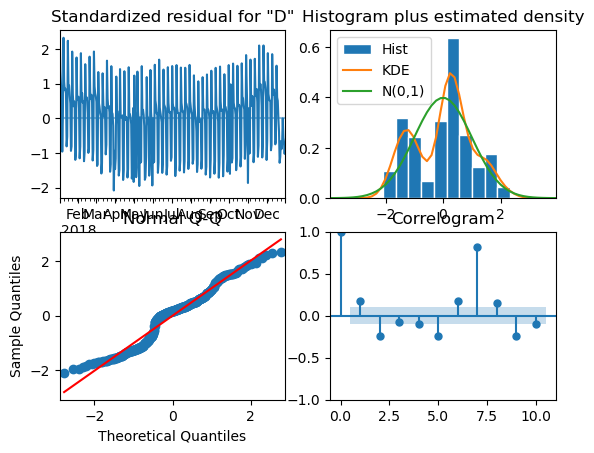

Generating ARIMA plot for: DK


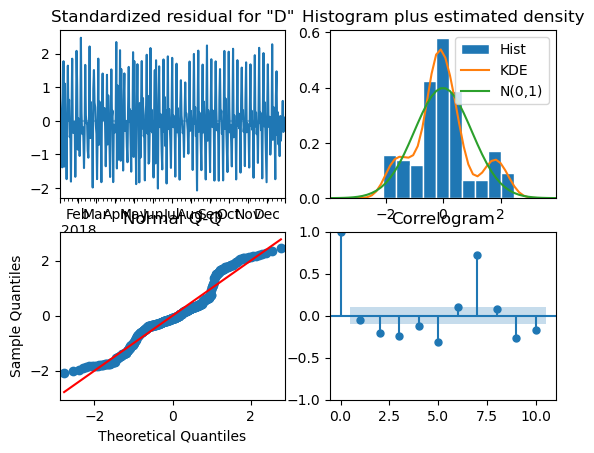

Generating ARIMA plot for: DK_1


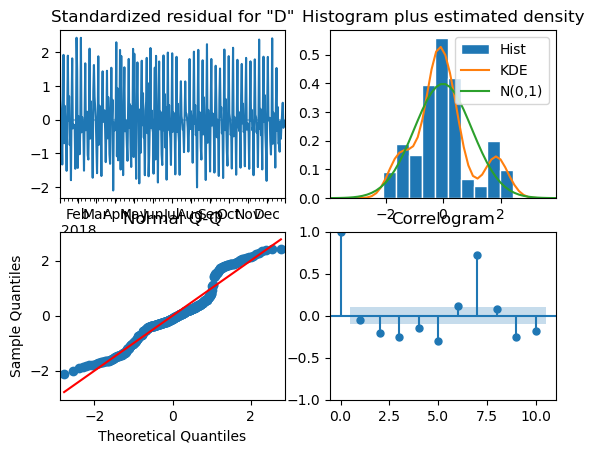

Generating ARIMA plot for: DK_2


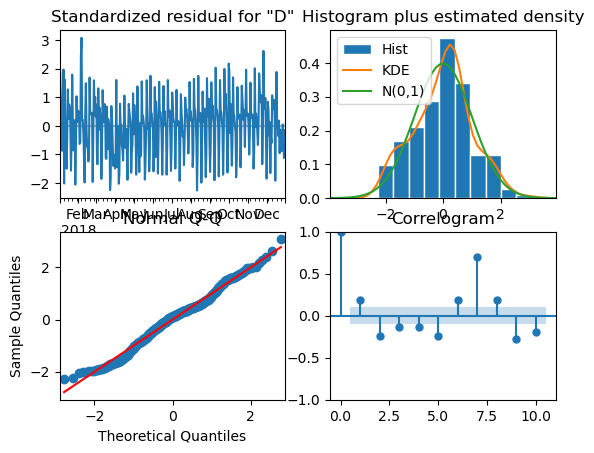

Generating ARIMA plot for: EE


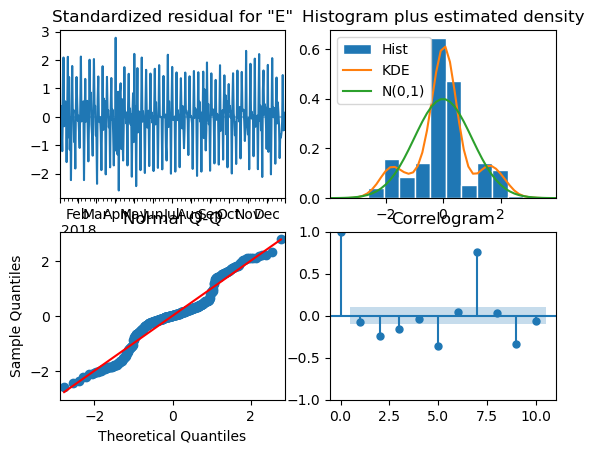

Generating ARIMA plot for: ES


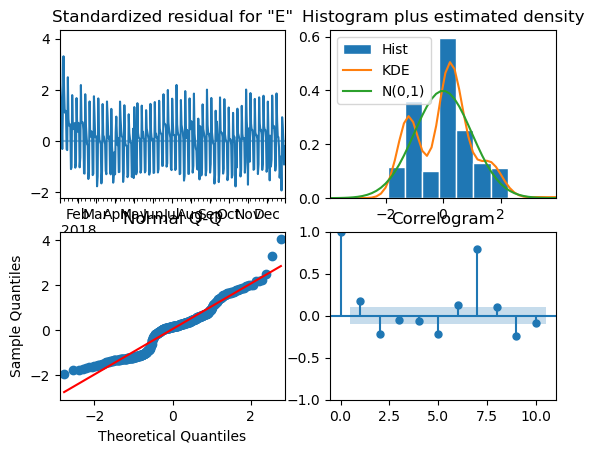

Generating ARIMA plot for: FI


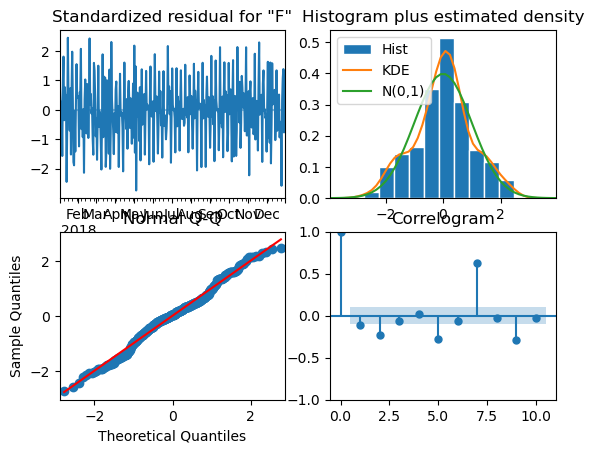

Generating ARIMA plot for: FR


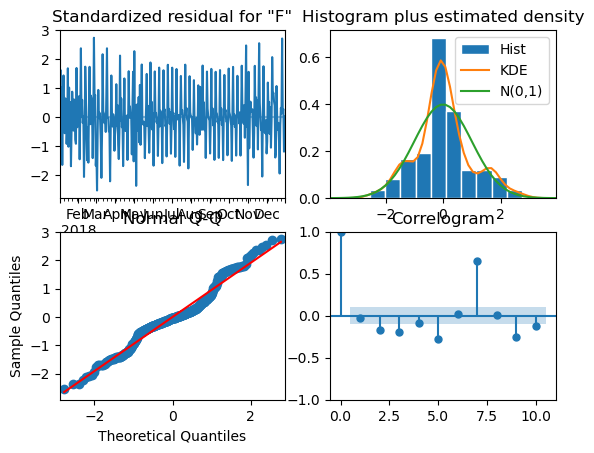

Generating ARIMA plot for: GB_GBN


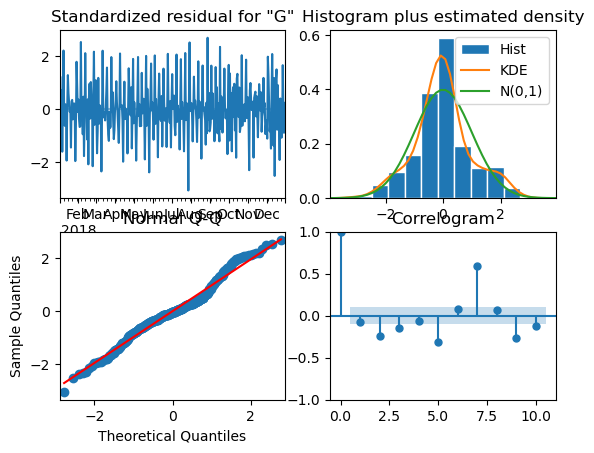

Generating ARIMA plot for: GB_NIR


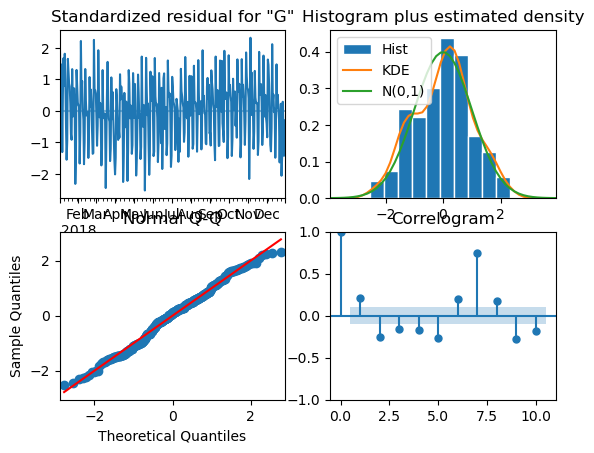

Generating ARIMA plot for: GB_UKM


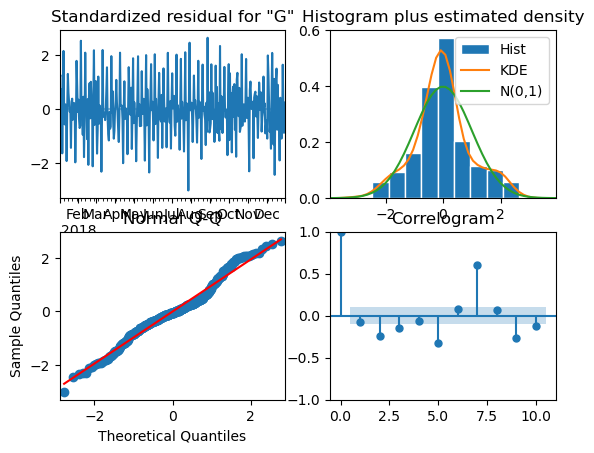

Generating ARIMA plot for: GR


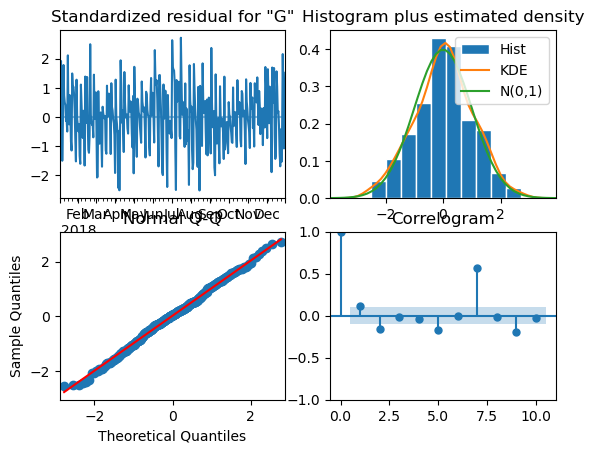

Generating ARIMA plot for: HR


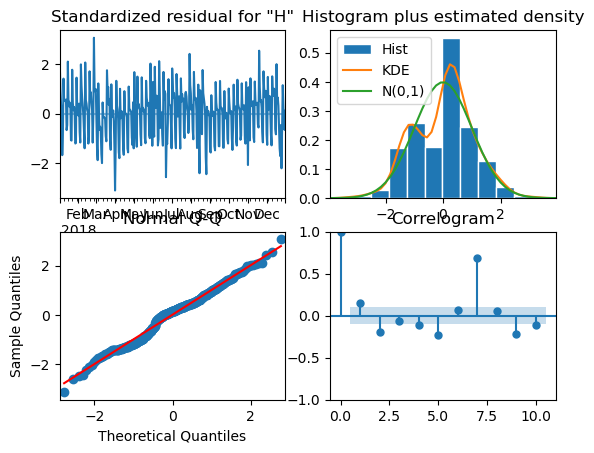

Generating ARIMA plot for: HU


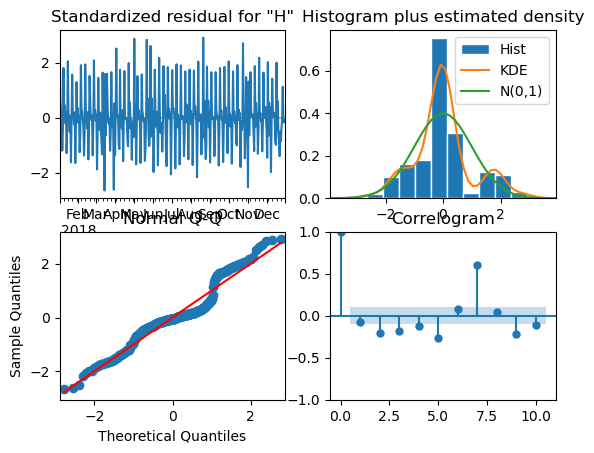

Generating ARIMA plot for: IE


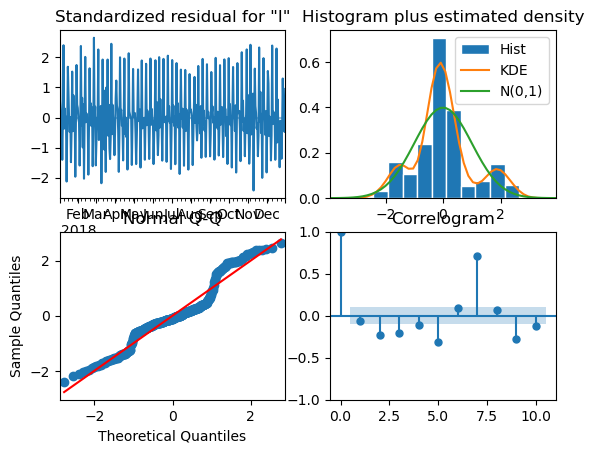

Generating ARIMA plot for: IE_sem


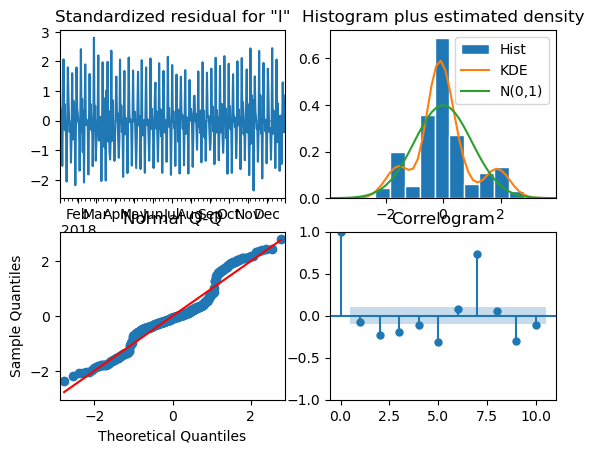

Generating ARIMA plot for: IT


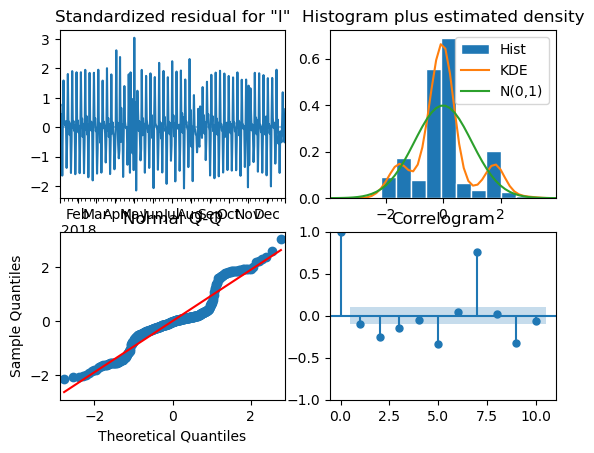

Generating ARIMA plot for: IT_CNOR


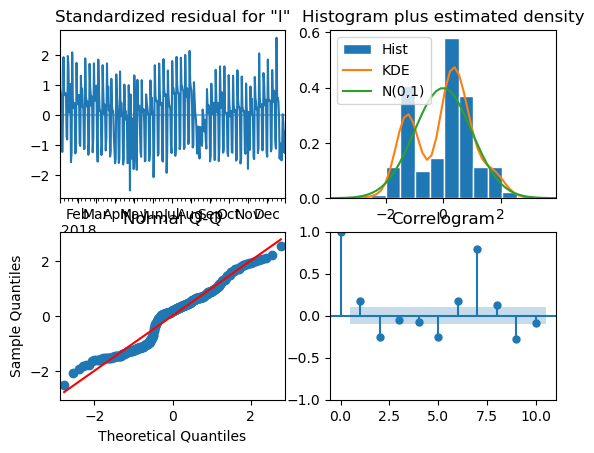

Generating ARIMA plot for: IT_CSUD


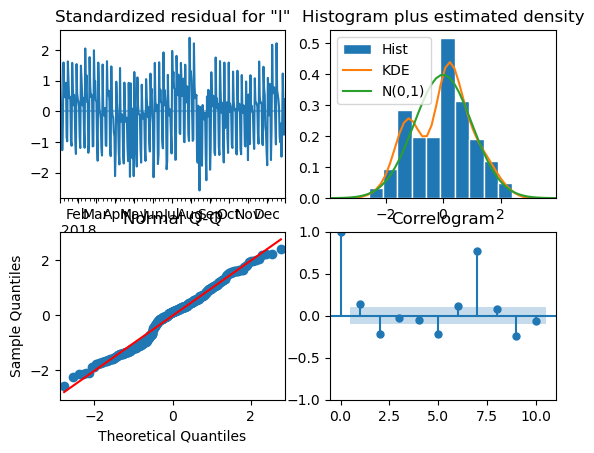

Generating ARIMA plot for: IT_NORD


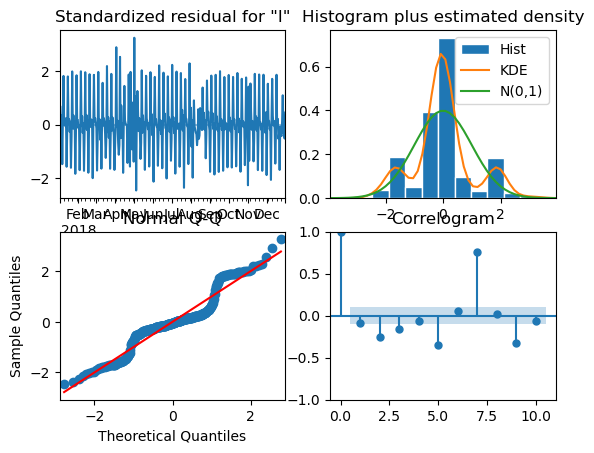

Generating ARIMA plot for: IT_SARD


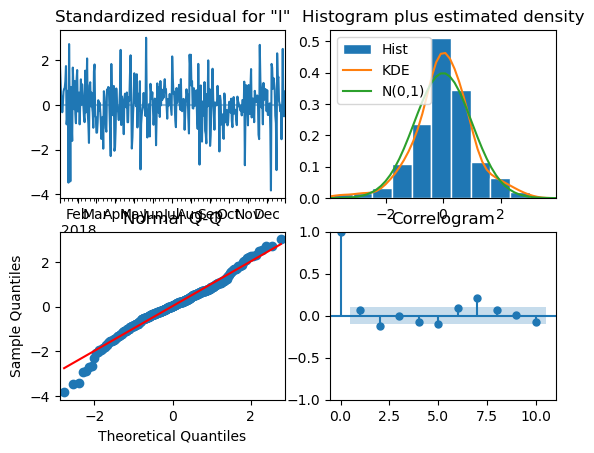

Generating ARIMA plot for: IT_SICI


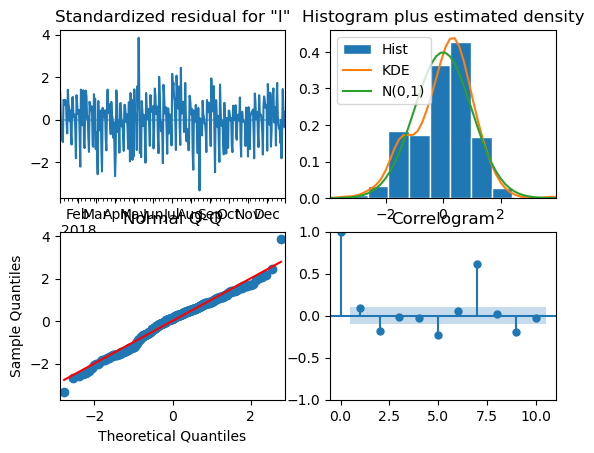

Generating ARIMA plot for: IT_SUD


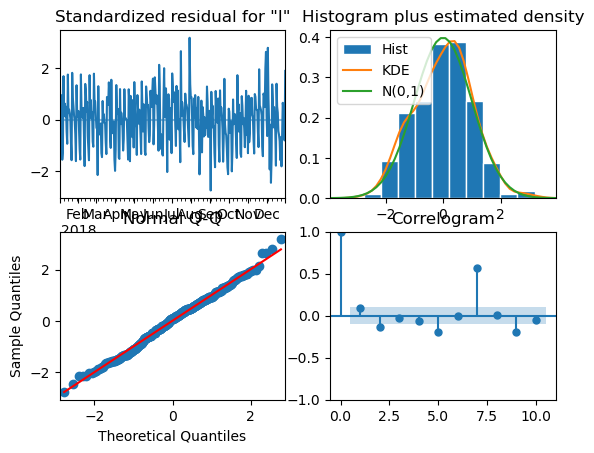

Generating ARIMA plot for: LT


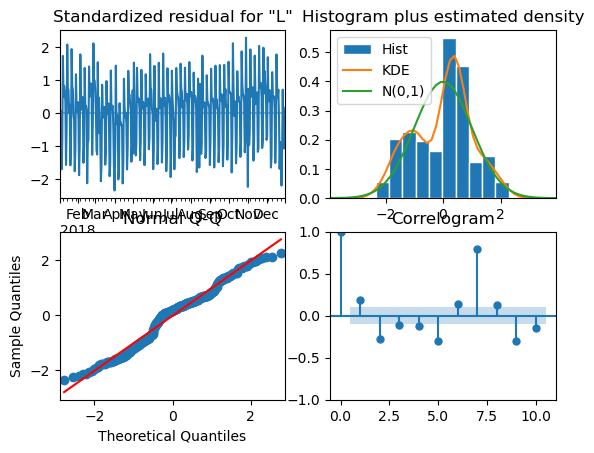

Generating ARIMA plot for: LU


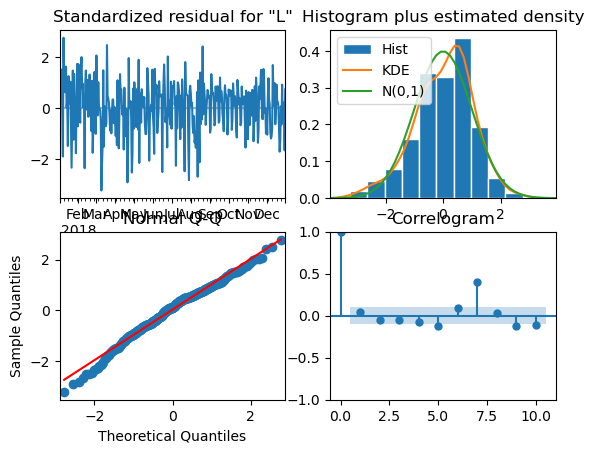

Generating ARIMA plot for: LV


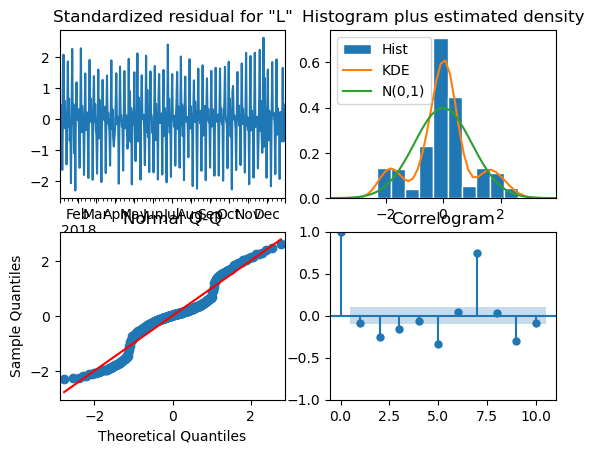

Generating ARIMA plot for: ME


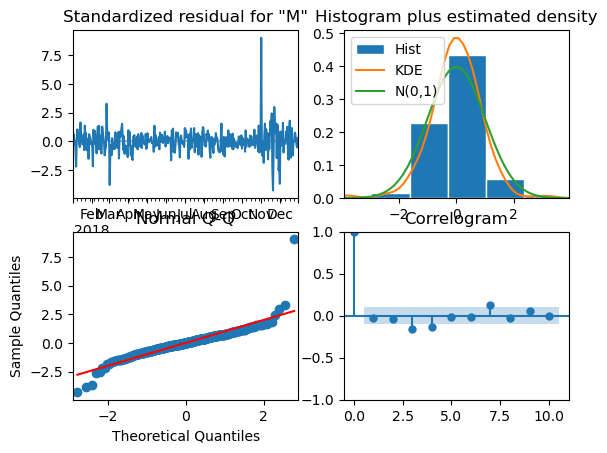

Generating ARIMA plot for: NL


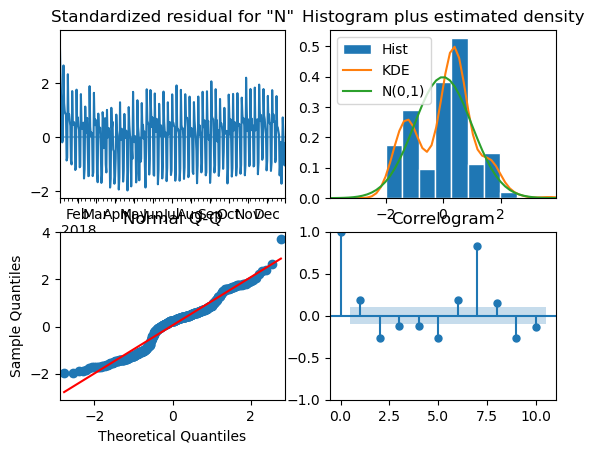

Generating ARIMA plot for: NO


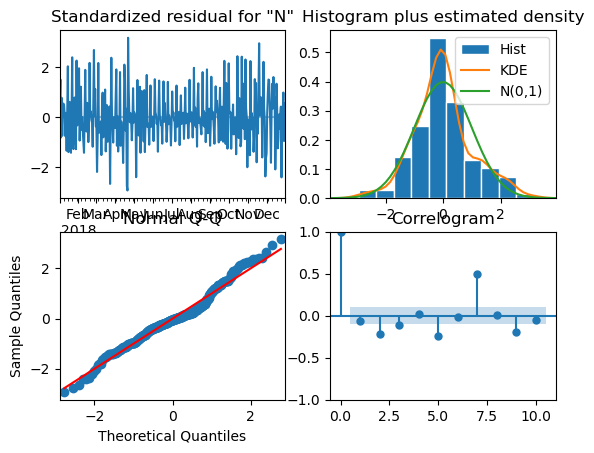

Generating ARIMA plot for: NO_1


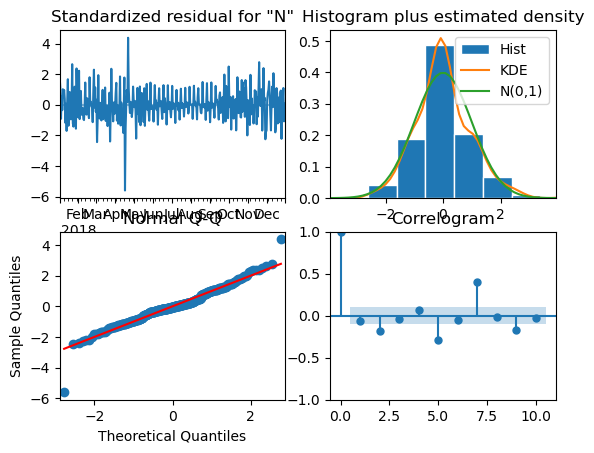

Generating ARIMA plot for: NO_2


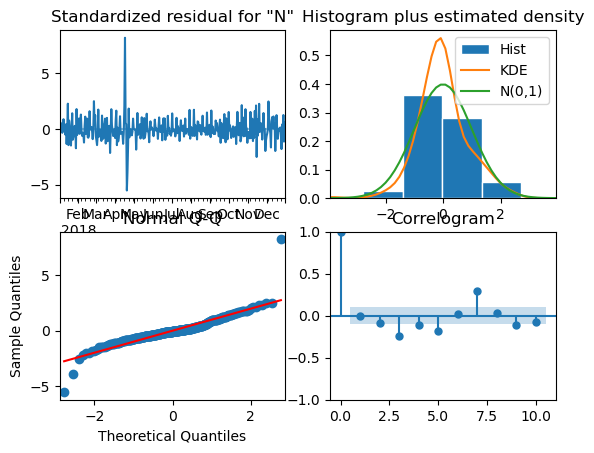

Generating ARIMA plot for: NO_3


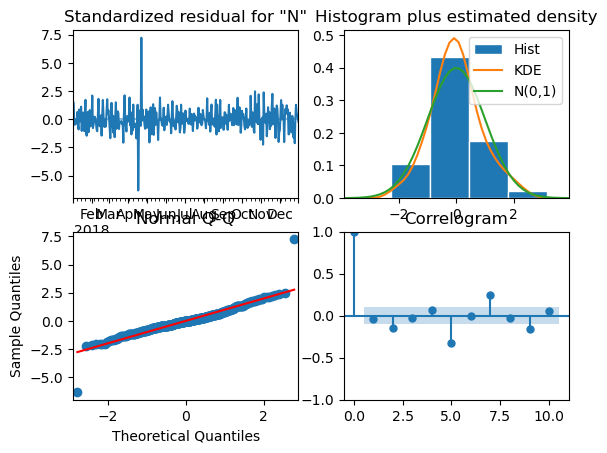

Generating ARIMA plot for: NO_4


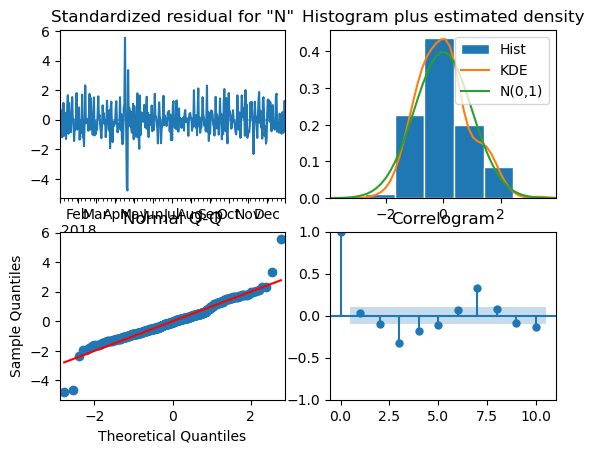

Generating ARIMA plot for: NO_5


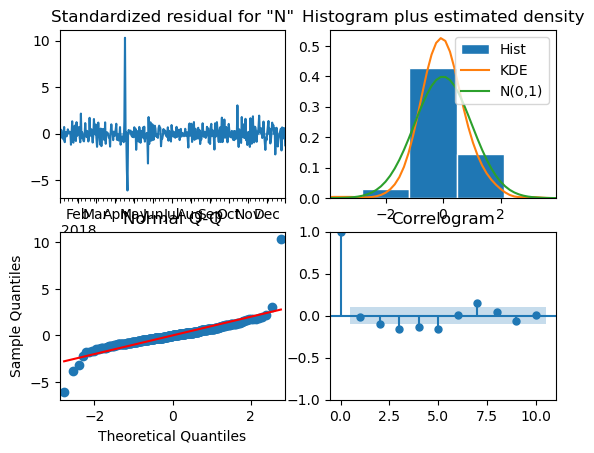

Generating ARIMA plot for: PL


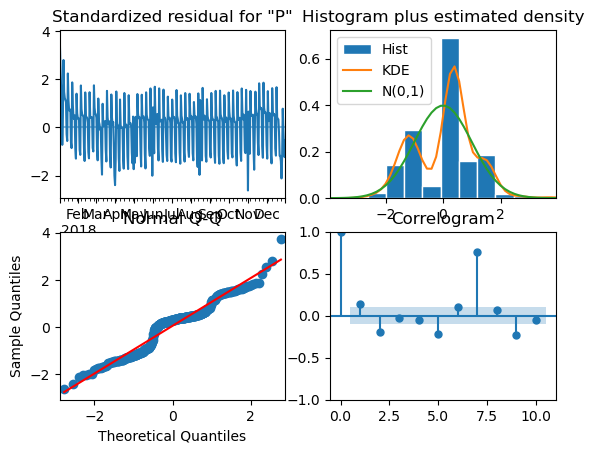

Generating ARIMA plot for: PT


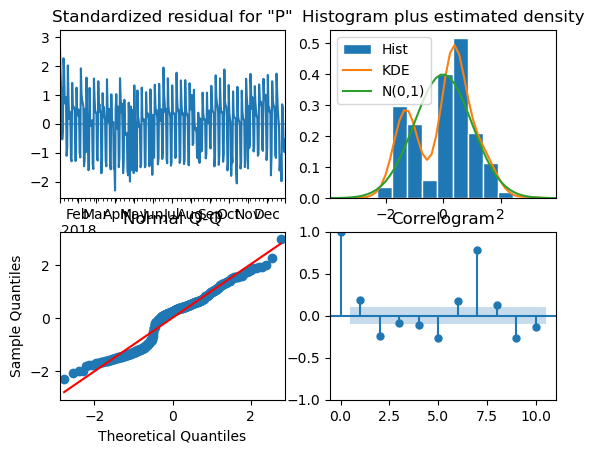

Generating ARIMA plot for: RO


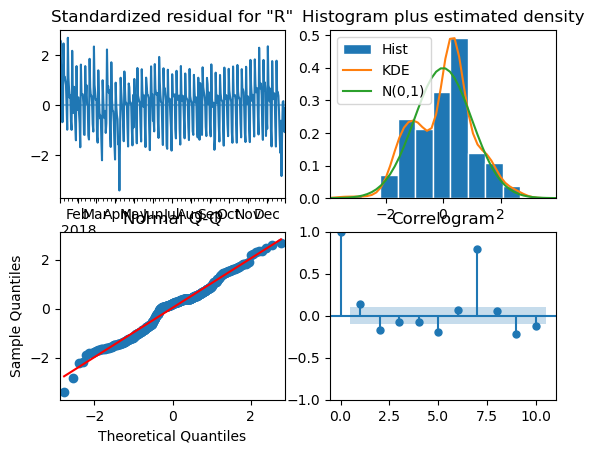

Generating ARIMA plot for: RS


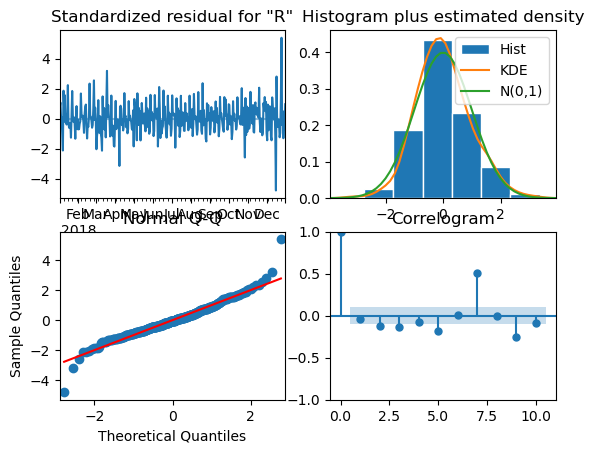

Generating ARIMA plot for: SE


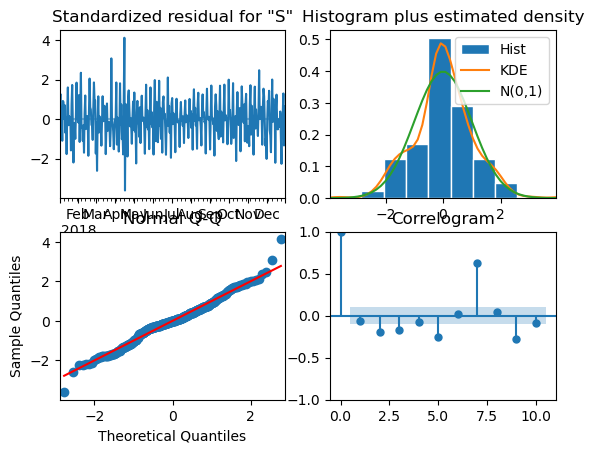

Generating ARIMA plot for: SE_1


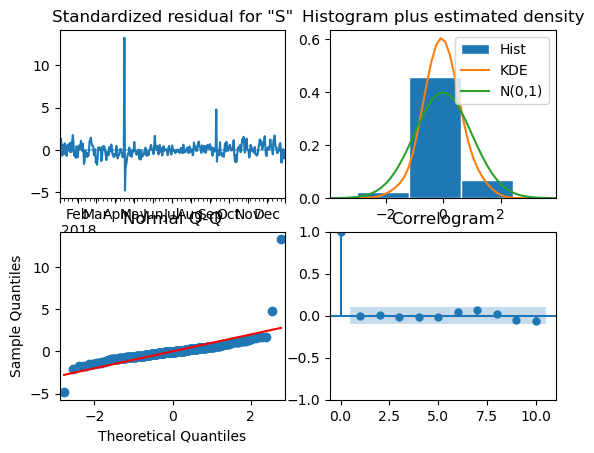

Generating ARIMA plot for: SE_2


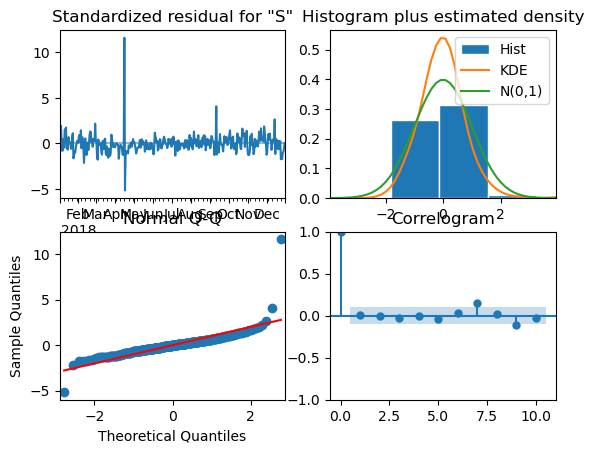

Generating ARIMA plot for: SE_3


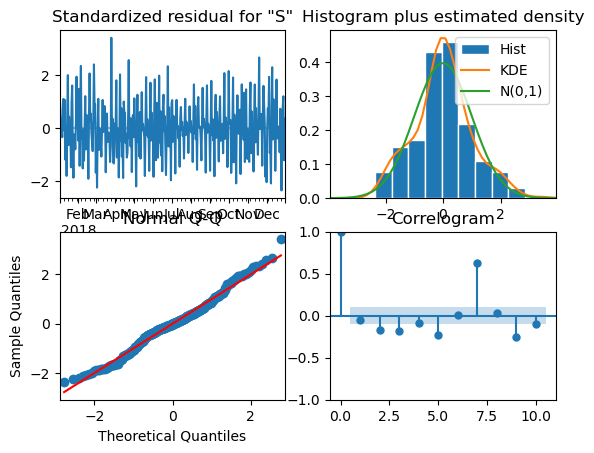

Generating ARIMA plot for: SE_4


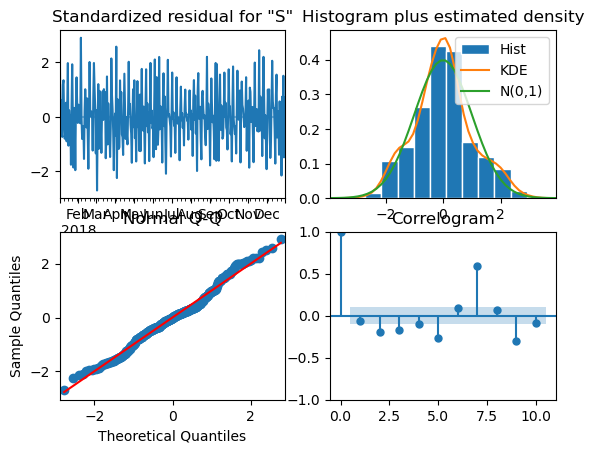

Generating ARIMA plot for: SI


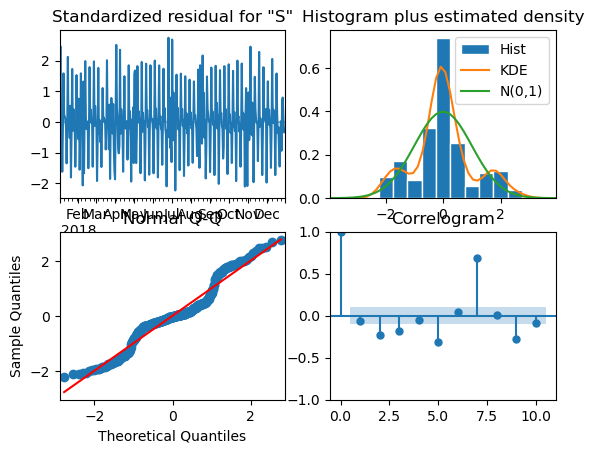

Generating ARIMA plot for: SK


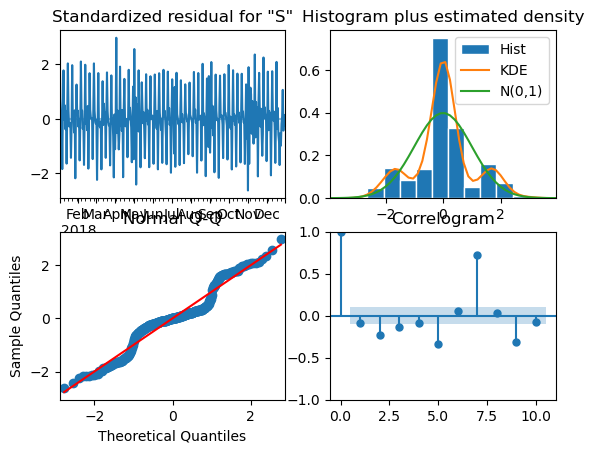

Generating ARIMA plot for: UA


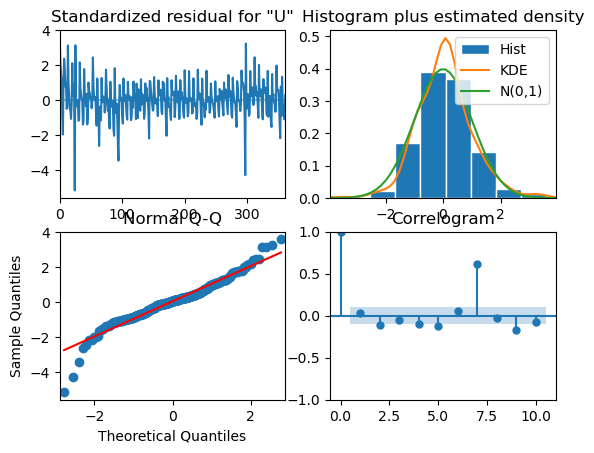

In [164]:
generate_and_save_arima_plots(df_60_daily_load_actual, 'daily_load_actual')

<Axes: xlabel='utc_timestamp'>

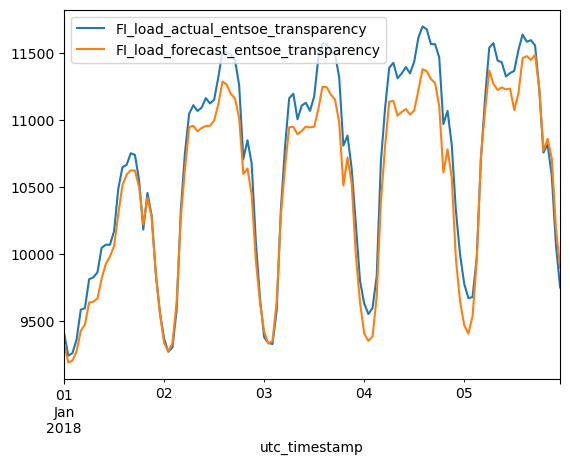

In [168]:
#take a look at some seasonality in Spain given high solar concentration 
#in the year 2018

sub_frame = df_60[['FI_load_actual_entsoe_transparency','FI_load_forecast_entsoe_transparency']].loc['2018-01-01':'2018-01-05']
sub_frame.plot()


## GARCH 

In [169]:
# GARCH has good insample forecast, now predict 1,3,5,7,10 day ahead vs actual vs forecast(exog)
# Generate out-of-sample predictions
forecasts = model_fit.forecast(horizon=5)
#transform the forecast into a pandas series
out_of_sample_predictions = forecasts.mean.iloc[-1]
display(out_of_sample_predictions)
# Align the actual values and predicted values
actual_values = sub_frame['ES_load_actual_entsoe_transparency'].iloc[1:]
out_of_sample_predictions.index = actual_values.index

# Plot actual vs. predicted returns
plt.figure(figsize=(10, 6))
plt.plot(actual_values.index, actual_values, label='Actual Returns', color='blue')
plt.plot(out_of_sample_predictions.index, out_of_sample_predictions, label='Predicted Returns', color='orange')
plt.plot(sub_frame['ES_load_forecast_entsoe_transparency'].iloc[1:], label='Forecast (exog) Returns', color='green')
plt.title('Actual demand vs. Predicted demand vs forecast (exog) demand')
plt.xlabel('Date')
plt.ylabel('Load')
plt.legend()
plt.show()

NameError: name 'model_fit' is not defined

In [19]:
# display the results for just AT 
# load from cache
import statsmodels.api as sm
at_model = sm.load(os.path.join(cache_dir, 'arima_models', '60_load_actual_AT_arima_model.pkl'))

In [20]:
sub_frame

,ES_load_actual_entsoe_transparency,ES_load_forecast_entsoe_transparency
utc_timestamp,,
2018-01-01 00:00:00+00:00,22009.0,22688.0
2018-01-01 01:00:00+00:00,20589.0,21521.0
2018-01-01 02:00:00+00:00,19547.0,20294.0
2018-01-01 03:00:00+00:00,18871.0,19489.0
2018-01-01 04:00:00+00:00,18688.0,19179.0
...,...,...
2018-01-05 19:00:00+00:00,30691.0,30906.0
2018-01-05 20:00:00+00:00,30420.0,30695.0
2018-01-05 21:00:00+00:00,28961.0,29754.0


## Try GARCH 